# 2D vs 2.5D UNet -- both phases, 5-fold cross-validation

K-fold sibling of `both_phase_loss_ablation_kfold_diagnostics.ipynb` and
`both_phase_augmentation_kfold_diagnostics.ipynb`. Fixes the configuration
those two notebooks converged on -- `phase='both'`, `augment=True`,
`loss='dice_ce'` -- and varies a new axis instead: whether the model sees one
slice at a time (`context_slices=0`, plain 2D) or a small stack of neighboring
z-slices as extra input channels (`context_slices=1`, "2.5D": `2*1+1=3`
slices, water+fat each, so 6 input channels instead of 2). `VolumeMRIDataset`
and `UNet` gained `context_slices` support this session -- see
`utils/data_loading.py`'s `_neighbor_indices`/`_preprocess_stack` and
`train.py`'s `n_channels_for()`. `context_slices=0` reproduces the exact
pre-existing 2D behaviour bit-for-bit (verified when that support was added),
so every prior `both_*` run remains a valid, uncontaminated 2D baseline.

**Directly motivated by `both_phase_loss_ablation_kfold_diagnostics.ipynb`'s**
final Tier-3 section (`show_eat_slice_neighborhood` / `eat_neighborhood_gap`),
which found that on many of the worst EAT failures, EAT was clearly visible
in the slice(s) immediately next to the one every loss arm got wrong --
direct visual/quantitative evidence that the missing information was one
slice away the whole time, which a 2D model (fed one slice at a time)
structurally cannot use and a 2.5D model can. This notebook is the follow-up
that actually trains a model with that context and checks whether it helps --
same worst-EAT-slice list, same neighborhood-gap metric, now also reporting
each arm's own center-slice Dice on those exact slices as the direct test of
the hypothesis (see the final Tier-3 section below).

**The 2D arm reuses already-finished checkpoints, no retraining.**
`both_data_aug_dice_ce_kfold{0..4}` (from `both_phase_augmentation_kfold_diagnostics.ipynb`
/ `run_both_phase_kfold.sh`) are already `phase='both'`, `augment=True`,
`loss='dice_ce'`, `split_seed=0`, `seed=fold` -- exactly the 2D config this
notebook needs, confirmed against their `run_config.json` files. Reusing them
saves ~5.7h of GPU time; only the 5 new `context_slices=1` runs need training.
`run_name_for()` below special-cases the `'2d'` arm to point at those existing
run directories instead of a fresh name.

**A note on image scale, since it's easy to get wrong here:** those existing
checkpoints were trained at `img_scale=0.5` (confirmed in their
`run_config.json`), NOT the `IMG_SCALE=1.0` that
`both_phase_loss_ablation_kfold_diagnostics.ipynb` and
`both_phase_augmentation_kfold_diagnostics.ipynb` declare in their config
cells. Those two notebooks' Tier-1 Results numbers are unaffected (read
straight from `val_metrics_per_patient.csv`, written during training at the
correct scale), but anything that re-runs inference IN the notebook itself
(slice-position profile, entropy, EAT visualizations, best/worst-slice
picks) has been feeding those models images at 2x the resolution they were
trained on. This notebook uses `IMG_SCALE=0.5` throughout, matching what its
own checkpoints actually trained at -- flagging the other two as a known
discrepancy, not fixing them here.

**Training does not happen in this kernel**, for the one new arm. From a
terminal: `bash run_context_slices_kfold.sh`. This notebook confirms the
split, then reads results back from disk once training has finished -- same
resume-from-disk design as its siblings.

**Full tier-2/tier-3 diagnostic toolkit**, carried over from
`both_phase_loss_ablation_kfold_diagnostics.ipynb`: cross-fold consistency,
precision/recall decomposition, size-stratified performance, a slice-position
performance profile, predictive-entropy uncertainty, terminal-slice failure
inspection, and the EAT-neighborhood analysis that motivated this whole
experiment. One structural difference from that notebook: `context_slices`
changes the model's input channel count AND what `VolumeMRIDataset.__getitem__`
returns (unlike the loss/augmentation axes, which changed neither), so every
per-arm helper below is keyed on the arm name directly (not a bare
`run_name_fn` closure) and there are two `VolumeMRIDataset` instances, one
per arm's window size, sharing the same on-disk raw-volume cache.

## Setup

In [1]:
import os

# only needed for the final test-set scoring cell at the bottom -- the split
# confirmation and pooled-analysis cells above it never touch the GPU
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
print(f"Targeting GPU: {os.environ['CUDA_VISIBLE_DEVICES']}")


Targeting GPU: 1


In [2]:
import sys
sys.path.append('.')

import json
import logging
import numpy as np
import torch
from pathlib import Path

logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))


/hpc/jgeo610/Virtual_ENV/unet_env/lib/python3.10/site-packages/torch/cuda/__init__.py:61: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]


Using device: cuda
Tesla V100-PCIE-32GB


In [3]:
import train
from unet import UNet
from utils import metrics
from utils.data_loading import VolumeMRIDataset

train.dir_img = Path('./data/imgs/')
train.dir_mask = Path('./data/masks/')
train.dir_checkpoint = Path('./checkpoints/')


## Experiment configuration

`PHASE`, `LOSS`, `AUGMENT` and `SPLIT_SEED` are fixed to match
`both_phase_augmentation_kfold_diagnostics.ipynb` and
`both_phase_loss_ablation_kfold_diagnostics.ipynb` exactly, so all three
notebooks' results sit in the same comparison space and share the same
frozen test set. `K_FOLDS=5` is the same choice as those two notebooks (the
pool has ~42 patients; 5 folds keeps each fold's own val set from getting
too small for its own checkpoint-selection signal).

The new axis is `CONTEXT_SLICES_FOR`: `'2d'` stays at `context_slices=0`
(plain 2D, one slice in -> one slice out), `'2p5d'` uses `context_slices=1`
(a 3-slice window on each of water/fat -> 6 input channels total). This is
the smallest possible 2.5D window; widening it later costs one line here.
`ARM_N_CHANNELS` records what each arm's model actually expects, since
(unlike every other axis explored in the sibling notebooks) this one changes
the model's input shape.

In [4]:
PHASE      = 'both'
LOSS       = 'dice_ce'
AUGMENT    = True
K_FOLDS    = 5

ARMS = ['2d', '2p5d']
BASELINE_ARM = '2d'
CONTEXT_SLICES_FOR = {'2d': 0, '2p5d': 1}

SPLIT_SEED   = 0        # FROZEN. Identical to every other both_* notebook -- do not
                         # change; this is what keeps the test set identical across all of them.
EPOCHS       = 40
BATCH_SIZE   = 8
LR           = 1e-5
IMG_SCALE    = 0.5      # matches what both_data_aug_dice_ce_kfold*'s checkpoints were
                         # actually trained at (see run_config.json) -- NOT the 1.0 the
                         # sibling notebooks declare; see the intro cell.
N_CLASSES    = train.PHASE_N_CLASSES[PHASE]     # 6 for 'both' (bg + LV/RV/LA/RA/EAT)
ARM_N_CHANNELS = {arm: train.n_channels_for(PHASE, CONTEXT_SLICES_FOR[arm]) for arm in ARMS}
AMP          = True
SELECT_ON    = 'macro_dice'
LR_SCHEDULE  = 'poly'
TEST_PERCENT = 0.15

RUN_PREFIX = 'ctx'

def run_name_for(arm, fold):
    if arm == '2d':
        # reuse both_phase_augmentation_kfold_diagnostics.ipynb's already-finished
        # runs -- see the intro cell. context_slices=0 reproduces their exact
        # behaviour bit-for-bit, so these ARE valid 2D-arm checkpoints, not an
        # approximation of them.
        return f'data_aug_{LOSS}_kfold{fold}'
    return f'{RUN_PREFIX}_{arm}_kfold{fold}'

# arm -> run_name_fn, same shape every shared-setup function below expects,
# matching the sibling notebooks' RUN_NAME_FN pattern
RUN_NAME_FN = {arm: (lambda f, arm=arm: run_name_for(arm, f)) for arm in ARMS}

# train_model prefixes non-water run names with '{phase}_' internally -- see
# CLAUDE.md ("water keeps unprefixed run names"). Mirrors run_dir_for() in
# every other both_* notebook.
def run_dir_for(run_name):
    full_name = run_name if PHASE == 'water' else f'{PHASE}_{run_name}'
    return train.dir_checkpoint / full_name

# fixed categorical order, slots 1-2 of the project's default palette (same
# validated CVD-safe slots the loss-ablation notebook uses for its first two
# arms) -- 2d is always blue, 2p5d is always orange, in every figure below.
ARM_COLORS = {'2d': '#2a78d6', '2p5d': '#eb6834'}
assert BASELINE_ARM in ARMS

print(f'{K_FOLDS}-fold, {EPOCHS} epochs each, {len(ARMS)} arms:')
for arm in ARMS:
    n_new = 0 if arm == '2d' else K_FOLDS
    for f in range(K_FOLDS):
        print(f'  {run_dir_for(run_name_for(arm, f)).name:<32} '
              f'(context_slices={CONTEXT_SLICES_FOR[arm]}, n_channels={ARM_N_CHANNELS[arm]})'
              + ('  [already finished]' if arm == '2d' else ''))
    print(f'    -> {n_new} new run(s) needed for {arm}')

# rough wall-clock: loss_ablation.ipynb measured ~68 min/40-epoch dice_ce run at
# phase='both'; 2.5D adds a handful of extra CPU-side per-slice normalize calls
# per item (see _preprocess_stack) but no extra conv work worth noting at this
# depth, so the same estimate applies to both arms. Only 2p5d's K_FOLDS runs are
# new -- 2d is already trained.
est_h = 68 * K_FOLDS / 60
print(f'\n~{est_h:.1f} h of NEW compute (2p5d only; divide by however many GPUs '
      f'run_context_slices_kfold.sh gets)')

# every diagnostic plot below saves here automatically, in addition to plt.show() --
# so nothing needs a live kernel/GPU to be VIEWED again later, only to be regenerated
POOLED_DIR = train.dir_checkpoint / f'{PHASE}_2d_vs_2p5d_kfold_pooled'
PLOTS_DIR = POOLED_DIR / 'plots'
SLICES_DIR = PLOTS_DIR / 'slices'
SLICES_DIR.mkdir(parents=True, exist_ok=True)   # also creates POOLED_DIR/PLOTS_DIR


5-fold, 40 epochs each, 2 arms:
  both_data_aug_dice_ce_kfold0     (context_slices=0, n_channels=2)  [already finished]
  both_data_aug_dice_ce_kfold1     (context_slices=0, n_channels=2)  [already finished]
  both_data_aug_dice_ce_kfold2     (context_slices=0, n_channels=2)  [already finished]
  both_data_aug_dice_ce_kfold3     (context_slices=0, n_channels=2)  [already finished]
  both_data_aug_dice_ce_kfold4     (context_slices=0, n_channels=2)  [already finished]
    -> 0 new run(s) needed for 2d
  both_ctx_2p5d_kfold0             (context_slices=1, n_channels=6)
  both_ctx_2p5d_kfold1             (context_slices=1, n_channels=6)
  both_ctx_2p5d_kfold2             (context_slices=1, n_channels=6)
  both_ctx_2p5d_kfold3             (context_slices=1, n_channels=6)
  both_ctx_2p5d_kfold4             (context_slices=1, n_channels=6)
    -> 5 new run(s) needed for 2p5d

~5.7 h of NEW compute (2p5d only; divide by however many GPUs run_context_slices_kfold.sh gets)


## Dataset

Two `VolumeMRIDataset` instances, one per arm's window size -- `context_slices`
changes what `__getitem__` returns (a single slice vs. a stacked neighbor
window), so the 2.5D arm's model needs a differently-shaped dataset feeding
it, unlike every other axis explored in the sibling notebooks. Both share the
same on-disk raw-volume cache (`data/preprocessed_cache/`, `_both`-suffixed
files, already fully populated by earlier `both_*` notebooks) -- windowing
happens in-memory off the cached whole volume, so building the second dataset
here is cheap, not a fresh DICOM/NIfTI parse. `dataset` (the canonical,
`context_slices=0` one) is what every visualization panel below reads the
plain underlying image from, and what patient/fold indexing is computed
from -- that indexing (`dataset.index`, `dataset.mask_file_for`) is identical
across both instances regardless of window size, since windowing is a
per-item transform only.

In [5]:
dataset = VolumeMRIDataset(train.dir_img, train.dir_mask, scale=IMG_SCALE,
                           phase=PHASE, context_slices=0)
dataset_for = {arm: (dataset if CONTEXT_SLICES_FOR[arm] == 0 else
                     VolumeMRIDataset(train.dir_img, train.dir_mask, scale=IMG_SCALE,
                                      phase=PHASE, context_slices=CONTEXT_SLICES_FOR[arm]))
              for arm in ARMS}

print(f'{len(dataset.mask_file_for)} patients, {len(dataset.index)} slices')
print(f'mask values: {dataset.mask_values}')
for arm in ARMS:
    sample_img = dataset_for[arm][0]['image']
    print(f'{arm}: context_slices={CONTEXT_SLICES_FOR[arm]}, sample image shape {tuple(sample_img.shape)}')


INFO: Found 50 patients, 4748 total slices
INFO: Scanning mask files to determine unique values...
INFO: Unique mask values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0]
INFO: Found 50 patients, 4748 total slices
INFO: Scanning mask files to determine unique values...
INFO: Unique mask values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0]


50 patients, 4748 slices
mask values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0]
2d: context_slices=0, sample image shape (2, 216, 216)
2p5d: context_slices=1, sample image shape (6, 216, 216)


### Confirm the folds and the test set before spending any GPU time

Two separate things get checked here: that the 5 folds are disjoint and cover
the whole non-test pool (basic correctness of `split_patients_kfold`), and
that the test set it produces -- the one scored exactly once, at the very
end -- is byte-for-byte the same 8 patients every other `both_*` notebook at
`split_seed=0` already uses. Uses the canonical `dataset` -- this is purely
patient/slice indexing, unaffected by `context_slices` or `IMG_SCALE`. If the
second assertion ever fails, something about the dataset or the split logic
changed and the frozen test set can no longer be trusted; do not proceed past
that without finding out why.

In [6]:
EXPECTED_TEST_PATIENTS = ['CADRE_1113', 'CADRE_1116_first', 'CADRE_1523', 'CADRE_1532',
                          'CADRE_1743', 'CADRE_1744', 'CADRE_1859', 'CADRE_1867']

all_val_patients = []
test_patients = None
for f in range(K_FOLDS):
    train_idx, val_idx, test_idx = train.split_patients_kfold(
        dataset, fold=f, k_folds=K_FOLDS, test_percent=TEST_PERCENT, seed=SPLIT_SEED
    )
    fold_test = sorted({dataset.index[i][0] for i in test_idx})
    fold_val = sorted({dataset.index[i][0] for i in val_idx})
    fold_train = sorted({dataset.index[i][0] for i in train_idx})

    if test_patients is None:
        test_patients = fold_test
    assert fold_test == test_patients, f'fold {f} has a different test set!'
    assert not (set(fold_val) & set(fold_train)), f'fold {f}: train/val overlap'
    assert not (set(fold_val) & set(fold_test)), f'fold {f}: val/test overlap'

    all_val_patients.append(set(fold_val))
    print(f'fold {f}: train {len(fold_train):>2} / val {len(fold_val):>2}   val = {fold_val}')

assert test_patients == EXPECTED_TEST_PATIENTS, \
    f'test set does not match the frozen split! got {test_patients}'

pool = set(dataset.mask_file_for) - set(test_patients)
union = set().union(*all_val_patients)
assert union == pool, 'folds do not cover the whole train+val pool'
for i in range(K_FOLDS):
    for j in range(i + 1, K_FOLDS):
        assert not (all_val_patients[i] & all_val_patients[j]), f'folds {i} and {j} overlap'

print(f'\nOK: test set matches the frozen split ({len(test_patients)} patients), '
      f'{K_FOLDS} folds are disjoint and cover the {len(pool)}-patient pool')


INFO: Patient-level 5-fold split of 50 patients / 4748 slices (seed 0), fold 0/4:
        train: 33 patients,  3138 slices
        val:    9 patients,   836 slices  ['CADRE_1382_second', 'CADRE_1395_second', 'CADRE_1521', 'CADRE_1671', 'CADRE_1855', 'CADRE_1857', 'CADRE_1861', 'CADRE_1872', 'CADRE_1875']
        test:   8 patients,   774 slices  ['CADRE_1113', 'CADRE_1116_first', 'CADRE_1523', 'CADRE_1532', 'CADRE_1743', 'CADRE_1744', 'CADRE_1859', 'CADRE_1867']
INFO: Patient-level 5-fold split of 50 patients / 4748 slices (seed 0), fold 1/4:
        train: 33 patients,  3111 slices
        val:    9 patients,   863 slices  ['CADRE_1131', 'CADRE_1382_first', 'CADRE_1404_second', 'CADRE_1517', 'CADRE_1545', 'CADRE_1672', 'CADRE_1714', 'CADRE_1863', 'CADRE_1871']
        test:   8 patients,   774 slices  ['CADRE_1113', 'CADRE_1116_first', 'CADRE_1523', 'CADRE_1532', 'CADRE_1743', 'CADRE_1744', 'CADRE_1859', 'CADRE_1867']
INFO: Patient-level 5-fold split of 50 patients / 4748 slices (seed

fold 0: train 33 / val  9   val = ['CADRE_1382_second', 'CADRE_1395_second', 'CADRE_1521', 'CADRE_1671', 'CADRE_1855', 'CADRE_1857', 'CADRE_1861', 'CADRE_1872', 'CADRE_1875']
fold 1: train 33 / val  9   val = ['CADRE_1131', 'CADRE_1382_first', 'CADRE_1404_second', 'CADRE_1517', 'CADRE_1545', 'CADRE_1672', 'CADRE_1714', 'CADRE_1863', 'CADRE_1871']
fold 2: train 34 / val  8   val = ['CADRE_1395', 'CADRE_1555', 'CADRE_1772', 'CADRE_1858', 'CADRE_1862', 'CADRE_1864', 'CADRE_1866', 'CADRE_1870']
fold 3: train 34 / val  8   val = ['CADRE_1404_first', 'CADRE_1528', 'CADRE_1598', 'CADRE_1645', 'CADRE_1675', 'CADRE_1850', 'CADRE_1860', 'CADRE_1869']
fold 4: train 34 / val  8   val = ['CADRE_1116_second', 'CADRE_1552', 'CADRE_1718', 'CADRE_1720', 'CADRE_1741', 'CADRE_1851', 'CADRE_1854', 'CADRE_1874']

OK: test set matches the frozen split (8 patients), 5 folds are disjoint and cover the 42-patient pool


## Shared setup: predicting any pool patient

Used by both Tier 2 and Tier 3 below, so it's defined once, early, rather than
buried inside the diagnostics section. Same principle as the sibling
notebooks: every pool patient has exactly one fold whose model never trained
on them -- predict that patient with THAT fold's model, nothing else,
regardless of which arm is being inspected. Also computes per-pixel
predictive entropy alongside the prediction -- same forward pass, one extra
softmax + reduction, no retraining, no extra model calls.

Every helper here takes `arm` (`'2d'` / `'2p5d'`) directly rather than a bare
`run_name_fn`, because an arm now determines three things instead of one:
the run name, the model's input channel count (`ARM_N_CHANNELS[arm]`), and
which dataset object to read from (`dataset_for[arm]`).

In [7]:
from collections import defaultdict

# which fold holds each pool patient out, once -- this never changes for a
# given SPLIT_SEED/K_FOLDS, independent of which arm you're looking at
_FOLD_OF = {}
for f in range(K_FOLDS):
    _, val_idx, _ = train.split_patients_kfold(dataset, fold=f, k_folds=K_FOLDS,
                                                test_percent=TEST_PERCENT, seed=SPLIT_SEED)
    for p in {dataset.index[i][0] for i in val_idx}:
        _FOLD_OF[p] = f

_PATIENT_IDXS = defaultdict(list)
for i, (p, _) in enumerate(dataset.index):
    _PATIENT_IDXS[p].append(i)

_model_cache = {}   # run_name -> loaded model, so re-visualizing doesn't reload weights
_pred_cache = {}    # (run_name, patient_id) -> (pred_vol, gt_vol, entropy_vol)


def fold_ready(arm, fold):
    """Whether this fold's best.pth exists yet -- lets pool-scanning functions
    skip unfinished folds instead of crashing on the first missing checkpoint."""
    return (run_dir_for(RUN_NAME_FN[arm](fold)) / 'best.pth').exists()


def load_fold_model(arm, fold):
    """Load (and cache, for this kernel) one fold's best.pth for one arm."""
    run_name = RUN_NAME_FN[arm](fold)
    if run_name not in _model_cache:
        model = UNet(n_channels=ARM_N_CHANNELS[arm], n_classes=N_CLASSES, bilinear=False)
        model = model.to(memory_format=torch.channels_last).to(device=device)
        state_dict = torch.load(run_dir_for(run_name) / 'best.pth', map_location=device)
        state_dict.pop('mask_values', None)      # injected by train.py, not a real weight
        model.load_state_dict(state_dict)
        model.eval()
        _model_cache[run_name] = model
    return _model_cache[run_name]


def predict_patient(patient_id, arm):
    """Predict one patient's whole volume -- prediction, ground truth, AND
    per-pixel predictive entropy -- with the ONE fold model that never trained
    on them, fed by that ARM's dataset (so a 2.5D model gets windowed input).
    Raises if patient_id isn't in the train+val pool (e.g. it's a held-out
    test patient -- deliberately not reachable from here)."""
    if patient_id not in _FOLD_OF:
        raise ValueError(f'{patient_id} is not a train+val pool patient '
                         '(it may be in the held-out test set)')
    fold = _FOLD_OF[patient_id]
    run_name = RUN_NAME_FN[arm](fold)
    key = (run_name, patient_id)
    if key not in _pred_cache:
        model = load_fold_model(arm, fold)
        pred_vol, gt_vol, entropy_vol = metrics.predict_volume(
            model, dataset_for[arm], _PATIENT_IDXS[patient_id], device, amp=AMP,
            batch_size=BATCH_SIZE, return_entropy=True)
        _pred_cache[key] = (pred_vol, gt_vol, entropy_vol)
    pred_vol, gt_vol, entropy_vol = _pred_cache[key]
    return pred_vol, gt_vol, entropy_vol, fold


def slice_scores(pred_vol, gt_vol):
    """Mean foreground Dice per slice; nan for slices with no GT foreground
    (an empty slice trivially scores 1.0 otherwise and would swamp 'best')."""
    scores = []
    for s in range(pred_vol.shape[0]):
        cs = [metrics.dice_binary(pred_vol[s] == c, gt_vol[s] == c) for c in range(1, N_CLASSES)]
        cs = [x for x in cs if not np.isnan(x)]
        scores.append(float(np.mean(cs)) if cs else float('nan'))
    return np.array(scores)


def pool_slice_table(arm):
    """One row per (patient, slice) across the whole pool: Dice, mean predictive
    entropy over the GT foreground, and normalized position (0 = first slice of
    that patient's volume, 1 = last). Predictions are cached, so re-calling this
    for an arm already visualized elsewhere is free. Patients whose fold hasn't
    finished training yet are skipped, not an error."""
    rows, skipped = [], 0
    for patient_id in sorted(_FOLD_OF):
        if not fold_ready(arm, _FOLD_OF[patient_id]):
            skipped += 1
            continue
        pred_vol, gt_vol, entropy_vol, fold = predict_patient(patient_id, arm)
        n_slices = pred_vol.shape[0]
        scores = slice_scores(pred_vol, gt_vol)
        for s in range(n_slices):
            if not np.isfinite(scores[s]):
                continue
            fg = gt_vol[s] > 0
            mean_entropy = float(entropy_vol[s][fg].mean()) if fg.any() else float('nan')
            rows.append({'patient_id': patient_id, 'slice_idx': s, 'fold': fold,
                        'position': s / max(1, n_slices - 1),
                        'dice': float(scores[s]), 'mean_entropy': mean_entropy})
    if skipped:
        print(f'pool_slice_table({arm}): {skipped}/{len(_FOLD_OF)} patients skipped '
              f'-- their fold has not finished training yet')
    return rows


def pool_entropy_by_class(arm):
    """Mean predictive entropy within each PREDICTED structure, per patient/class
    -- same (patient, class) shape as the dice/precision/recall rows already in
    `pooled_rows`, so it can be joined against them directly. Same skip-if-not-
    finished tolerance as pool_slice_table()."""
    rows, skipped = [], 0
    for patient_id in sorted(_FOLD_OF):
        if not fold_ready(arm, _FOLD_OF[patient_id]):
            skipped += 1
            continue
        pred_vol, gt_vol, entropy_vol, fold = predict_patient(patient_id, arm)
        for cls in range(1, N_CLASSES):
            mask = pred_vol == cls
            mean_entropy = float(entropy_vol[mask].mean()) if mask.any() else float('nan')
            rows.append({'patient_id': patient_id, 'cls': cls,
                        'class_name': train.PHASE_CLASS_NAMES[PHASE][cls],
                        'mean_entropy': mean_entropy})
    if skipped:
        print(f'pool_entropy_by_class({arm}): {skipped}/{len(_FOLD_OF)} patients skipped '
              f'-- their fold has not finished training yet')
    return rows


print(f'{len(_FOLD_OF)} pool patients indexed to their held-out fold; '
      f'models/predictions load lazily and are cached per kernel session')


INFO: Patient-level 5-fold split of 50 patients / 4748 slices (seed 0), fold 0/4:
        train: 33 patients,  3138 slices
        val:    9 patients,   836 slices  ['CADRE_1382_second', 'CADRE_1395_second', 'CADRE_1521', 'CADRE_1671', 'CADRE_1855', 'CADRE_1857', 'CADRE_1861', 'CADRE_1872', 'CADRE_1875']
        test:   8 patients,   774 slices  ['CADRE_1113', 'CADRE_1116_first', 'CADRE_1523', 'CADRE_1532', 'CADRE_1743', 'CADRE_1744', 'CADRE_1859', 'CADRE_1867']
INFO: Patient-level 5-fold split of 50 patients / 4748 slices (seed 0), fold 1/4:
        train: 33 patients,  3111 slices
        val:    9 patients,   863 slices  ['CADRE_1131', 'CADRE_1382_first', 'CADRE_1404_second', 'CADRE_1517', 'CADRE_1545', 'CADRE_1672', 'CADRE_1714', 'CADRE_1863', 'CADRE_1871']
        test:   8 patients,   774 slices  ['CADRE_1113', 'CADRE_1116_first', 'CADRE_1523', 'CADRE_1532', 'CADRE_1743', 'CADRE_1744', 'CADRE_1859', 'CADRE_1867']
INFO: Patient-level 5-fold split of 50 patients / 4748 slices (seed

42 pool patients indexed to their held-out fold; models/predictions load lazily and are cached per kernel session


## Training

The 2D arm needs nothing -- it reuses `both_data_aug_dice_ce_kfold{0..4}`,
already finished. Only the 2.5D arm needs training, from a terminal on a node
with GPUs free:

```bash
bash run_context_slices_kfold.sh          # uses every GPU nvidia-smi reports
bash run_context_slices_kfold.sh 0 2 3    # or pin it to specific GPU indices
```

This launches `K_FOLDS` (5) `train.py` processes with `--context-slices 1`,
distributed round-robin across whatever GPU indices you give it. Each run is
independent and resumable -- rerunning the script skips any run whose
`run_config.json` already has `'finished'`. Check progress with `nvidia-smi` /
`wandb`; come back to this notebook once the runs you care about are done --
everything below reads purely from disk, so a fresh kernel is fine.

## Results

In [8]:
def load_fold_rows(arm):
    """Concatenate val_metrics_per_patient.csv across every FINISHED fold.

    Folds are DISJOINT patients -- pooling them is a plain concatenation, not
    an average. Each patient appears in exactly one fold's val set, so this
    produces one row per (patient, class) covering the whole train+val pool.
    """
    rows, folds_found = [], []
    for f in range(K_FOLDS):
        run_dir = run_dir_for(RUN_NAME_FN[arm](f))
        csv_path = run_dir / 'val_metrics_per_patient.csv'
        cfg_path = run_dir / 'run_config.json'
        if not (csv_path.exists() and cfg_path.exists()):
            continue
        if 'finished' not in json.loads(cfg_path.read_text()):
            continue
        rows.extend(metrics.load_per_patient(csv_path))
        folds_found.append(f)
    return rows, folds_found


pooled_rows = {}
for arm in ARMS:
    rows, folds_found = load_fold_rows(arm)
    pooled_rows[arm] = rows
    patients = sorted({r['patient_id'] for r in rows})
    status = folds_found if len(folds_found) == K_FOLDS else f'{folds_found} (incomplete)'
    print(f'{arm:<8} folds finished: {status}   {len(patients)} patients pooled')


2d       folds finished: [0, 1, 2, 3, 4]   42 patients pooled
2p5d     folds finished: [0, 1, 2, 3, 4]   42 patients pooled


### Per-class, side by side

Same layout as the sibling notebooks -- `mean +/- SD` over the pooled
train+val patients (up to ~42), not just a single split's 7-8 validation
patients.

In [9]:
ORDER = ['LV', 'RV', 'LA', 'RA', 'EAT', 'all_classes_macro']

summaries = {}
for arm in ARMS:
    _, folds_found = load_fold_rows(arm)
    if len(folds_found) == K_FOLDS and pooled_rows[arm]:
        summaries[arm] = {r['class_name']: r for r in metrics.summarise(pooled_rows[arm])}

have = [a for a in ARMS if a in summaries]
if len(have) < len(ARMS):
    print('Not every arm has all K_FOLDS finished yet -- only complete arms are summarised.\n')

n_pool = len(set(dataset.mask_file_for) - set(test_patients))
for metric, unit, better in [('dice', '', 'higher'),
                             ('hd95_mm', ' mm', 'lower'),
                             ('assd_mm', ' mm', 'lower')]:
    print(f'\n=== {metric}{unit}  ({better} is better)   '
          f'mean +/- SD over up to {n_pool} pooled train+val patients ===')
    print(f'{"":<20}' + ''.join(f'{a:>24}' for a in have))
    for cls in ORDER:
        cells_ = []
        for a in have:
            r = summaries[a].get(cls)
            if r is None:
                cells_.append(f'{"n/a":>24}')
                continue
            cells_.append(f'{r[f"{metric}_mean"]:>13.4f} +/- {r[f"{metric}_sd"]:<7.4f}')
        print(f'{cls:<20}' + ''.join(cells_))


print(f'\n=== n_missed  (ground truth present, prediction empty -- lower is better) ===')
print(f'{"":<20}' + ''.join(f'{a:>24}' for a in have))
for cls in ORDER:
    cells_ = []
    for a in have:
        r = summaries[a].get(cls)
        cells_.append(f'{"n/a":>24}' if r is None else f'{r["n_missed"]:>24}')
    print(f'{cls:<20}' + ''.join(cells_))



=== dice  (higher is better)   mean +/- SD over up to 42 pooled train+val patients ===
                                          2d                    2p5d
LV                         0.9450 +/- 0.0221        0.9466 +/- 0.0192 
RV                         0.9295 +/- 0.0329        0.9316 +/- 0.0296 
LA                         0.9181 +/- 0.0226        0.9216 +/- 0.0212 
RA                         0.9355 +/- 0.0210        0.9326 +/- 0.0257 
EAT                        0.7658 +/- 0.0445        0.7662 +/- 0.0448 
all_classes_macro          0.8988 +/- 0.0189        0.8997 +/- 0.0175 

=== hd95_mm mm  (lower is better)   mean +/- SD over up to 42 pooled train+val patients ===
                                          2d                    2p5d
LV                         5.7118 +/- 7.3251        3.7918 +/- 1.8802 
RV                         4.5290 +/- 4.1851        4.0949 +/- 3.5665 
LA                         4.7537 +/- 2.2685        4.4651 +/- 2.0055 
RA                         3.6122 +/- 2.23

## Figures

INFO: generated new fontManager


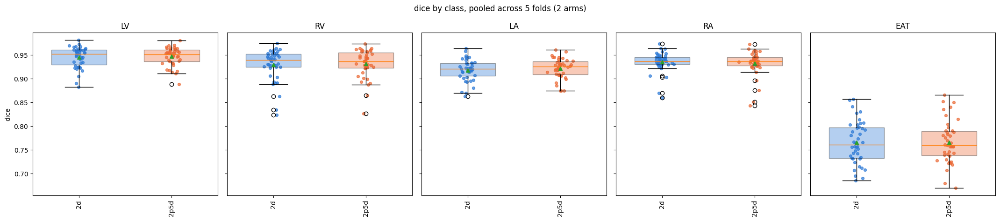

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/boxplot_dice.png


In [10]:
ORDER_FIG = ['LV', 'RV', 'LA', 'RA', 'EAT']
METRIC = 'dice'   # 'dice' | 'precision' | 'recall' | 'hd95_mm' | 'assd_mm'

import matplotlib.pyplot as plt

arms_present = [a for a in ARMS if pooled_rows.get(a)]

if not arms_present:
    print('No arm has any finished folds yet -- nothing to plot.')
else:
  jitter = np.random.default_rng(0)
  fig, axes = plt.subplots(1, len(ORDER_FIG), figsize=(4.3 * len(ORDER_FIG), 4.8), sharey=True)
  axes = np.atleast_1d(axes)
  for ax, cls in zip(axes, ORDER_FIG):
    data = [[r[METRIC] for r in pooled_rows[a]
             if r['class_name'] == cls and np.isfinite(r[METRIC])]
            for a in arms_present]

    box = ax.boxplot(data, tick_labels=arms_present, showmeans=True, widths=0.6, patch_artist=True)
    for patch, a in zip(box['boxes'], arms_present):
        patch.set_facecolor(ARM_COLORS[a])
        patch.set_alpha(0.35)
    for i, (vals, a) in enumerate(zip(data, arms_present), start=1):
        ax.scatter(jitter.normal(i, 0.045, len(vals)), vals, color=ARM_COLORS[a], alpha=0.7, s=18)
    ax.set_title(cls)
    ax.tick_params(axis='x', rotation=90)
    ax.set_ylabel(METRIC if ax is axes[0] else '')
  fig.suptitle(f'{METRIC} by class, pooled across {K_FOLDS} folds ({len(arms_present)} arms)')
  fig.tight_layout()
  save_path = PLOTS_DIR / f'boxplot_{METRIC}.png'
  fig.savefig(save_path, dpi=150, bbox_inches='tight')
  plt.show()
  print(f'saved to {save_path}')


## Paired comparison: 2.5D vs 2D, pooled across folds

`compare_runs` pairs on `(patient_id, class_name)` -- the shared pool is every
train+val patient (~42), because each patient's per-arm scores come from that
patient's OWN held-out fold's model (only `context_slices` differs between
arms at a given fold), so the pairing is still valid patient-for-patient.

**Caveat, carried over from the sibling notebooks:** patients held out
together in one fold are scored by that fold's one trained model each, so
they share that model's training-noise -- the pooled n is not fully
independent in the textbook sense (Bengio & Grandvalet 2004). Read the
p-values below as more informative than a single-split version, not as exact.
The macro row is the single pre-specified primary endpoint; per-chamber rows
are descriptive.

In [11]:
# POOLED_DIR was already created in the config cell above
pooled_paths = {}
for arm in ARMS:
    path = POOLED_DIR / f'{arm}_val_metrics_per_patient.csv'
    metrics.write_csv(pooled_rows[arm], path)
    pooled_paths[arm] = path
print('pooled CSVs written to', POOLED_DIR)

baseline_patients = {r['patient_id'] for r in pooled_rows.get(BASELINE_ARM, [])}
if not baseline_patients:
    print(f'\n{BASELINE_ARM} has no finished folds yet -- nothing to compare against.')
else:
    for arm in ARMS:
        if arm == BASELINE_ARM:
            continue
        if not pooled_rows.get(arm):
            print(f'\n== {arm}: not run yet, skipping')
            continue

        arm_patients = {r['patient_id'] for r in pooled_rows[arm]}
        if arm_patients != baseline_patients:
            print(f'\nWARNING: {BASELINE_ARM} has {len(baseline_patients)} patients pooled, '
                  f'{arm} has {len(arm_patients)} -- compare_runs will only use the '
                  f'{len(baseline_patients & arm_patients)} patients shared by both. Wait for all '
                  f'folds to finish on both arms before trusting this comparison.')

        print(f'\n===== {BASELINE_ARM}  vs  {arm}  (pooled train+val) =====')
        comparison = metrics.compare_runs(pooled_paths[BASELINE_ARM], pooled_paths[arm],
                                          label_a=BASELINE_ARM, label_b=arm)
        print(metrics.format_comparison(comparison, BASELINE_ARM, arm))


INFO: Wrote 210 rows to checkpoints/both_2d_vs_2p5d_kfold_pooled/2d_val_metrics_per_patient.csv
INFO: Wrote 210 rows to checkpoints/both_2d_vs_2p5d_kfold_pooled/2p5d_val_metrics_per_patient.csv


pooled CSVs written to checkpoints/both_2d_vs_2p5d_kfold_pooled

===== 2d  vs  2p5d  (pooled train+val) =====
class               metric      n          2d        2p5d      diff         p    p_holm
---------------------------------------------------------------------------------------
 EAT                dice       42      0.7612      0.7602   +0.0017    0.7476    1.0000
 EAT                hd95_mm    42        4.47        4.45     -0.06    0.7286    1.0000
 EAT                assd_mm    42        1.24        1.22     -0.02    0.2743    1.0000
 LA                 dice       42      0.9202      0.9253   +0.0040    0.0267    0.4004
 LA                 hd95_mm    42        3.99        3.75     -0.21    0.2409    1.0000
 LA                 assd_mm    42        1.28        1.25     -0.04    0.3991    1.0000
 LV                 dice       42      0.9520      0.9514   -0.0010    0.8334    1.0000
 LV                 hd95_mm    42        3.74        3.18     +0.00    0.1461    1.0000
 LV       

### Cross-fold consistency (still Tier 1)

The pooled comparison above treats every patient as one data point, but it's
worth also checking the more basic question directly: does EVERY fold agree
that 2.5D is better, or is the pooled win driven by one or two folds while
others disagree? Each fold's own `best_val_macro_dice` (already recorded in
its `run_config.json`, no extra computation) answers this.

2p5d scored higher than 2d in 3/5 finished folds


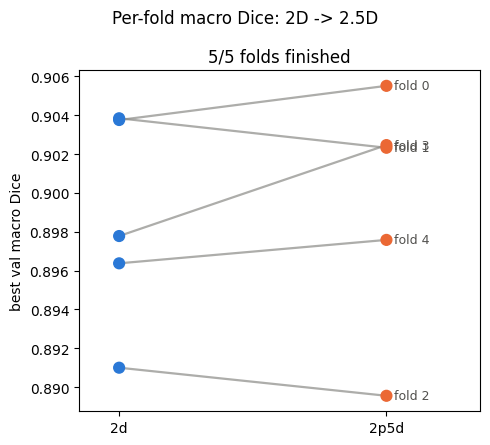

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/cross_fold_consistency.png


In [12]:
import matplotlib.pyplot as plt

fold_scores = {arm: [] for arm in ARMS}
for arm in ARMS:
    for f in range(K_FOLDS):
        cfg_path = run_dir_for(RUN_NAME_FN[arm](f)) / 'run_config.json'
        score = float('nan')
        if cfg_path.exists():
            cfg = json.loads(cfg_path.read_text())
            score = cfg.get('best_val_macro_dice', float('nan'))
        fold_scores[arm].append(score)

other_arms = [a for a in ARMS if a != BASELINE_ARM]
fig, axes = plt.subplots(1, len(other_arms), figsize=(5 * len(other_arms), 4.5), sharey=True)
axes = np.atleast_1d(axes)

any_plotted = False
for ax, arm in zip(axes, other_arms):
    folds_plotted = 0
    for f in range(K_FOLDS):
        b, a = fold_scores[BASELINE_ARM][f], fold_scores[arm][f]
        if not (np.isfinite(b) and np.isfinite(a)):
            continue
        ax.plot([0, 1], [b, a], color='#8a8a86', alpha=0.7, linewidth=1.6, zorder=1)
        ax.scatter([0, 1], [b, a], color=[ARM_COLORS[BASELINE_ARM], ARM_COLORS[arm]], s=60, zorder=2)
        ax.annotate(f'fold {f}', (1.03, a), va='center', fontsize=9, color='#52514e')
        folds_plotted += 1
    ax.set_xlim(-0.15, 1.35)
    ax.set_xticks([0, 1])
    ax.set_xticklabels([BASELINE_ARM, arm])
    ax.set_title(f'{folds_plotted}/{K_FOLDS} folds finished')
    if folds_plotted:
        any_plotted = True
        n_agree = sum(1 for f in range(K_FOLDS)
                     if np.isfinite(fold_scores[BASELINE_ARM][f]) and np.isfinite(fold_scores[arm][f])
                     and fold_scores[arm][f] > fold_scores[BASELINE_ARM][f])
        print(f'{arm} scored higher than {BASELINE_ARM} in {n_agree}/{folds_plotted} finished folds')

axes[0].set_ylabel('best val macro Dice')
if any_plotted:
    fig.suptitle('Per-fold macro Dice: 2D -> 2.5D')
    fig.tight_layout()
    save_path = PLOTS_DIR / 'cross_fold_consistency.png'
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'saved to {save_path}')
else:
    print('No fold has finished on both an arm and the baseline yet -- nothing to plot.')


## Tier 2 -- explanatory diagnostics

Stratified, quantitative views that explain *why* the Tier-1 numbers look the
way they do, rather than just confirming that they do. None of this decides
"which arm wins" on its own -- it's context for the decision above.

### Precision / recall decomposition

Dice is precision and recall's harmonic mean, so it can't tell you whether
2.5D context is fixing over-segmentation or under-segmentation. Reads the
same pooled per-patient rows already loaded in the Results section above.

class           2d precision           2d recall      2p5d precision         2p5d recall
LV                    0.9450              0.9466              0.9491              0.9456
RV                    0.9273              0.9339              0.9285              0.9370
LA                    0.9204              0.9185              0.9232              0.9221
RA                    0.9341              0.9385              0.9410              0.9262
EAT                   0.7601              0.7798              0.7626              0.7766


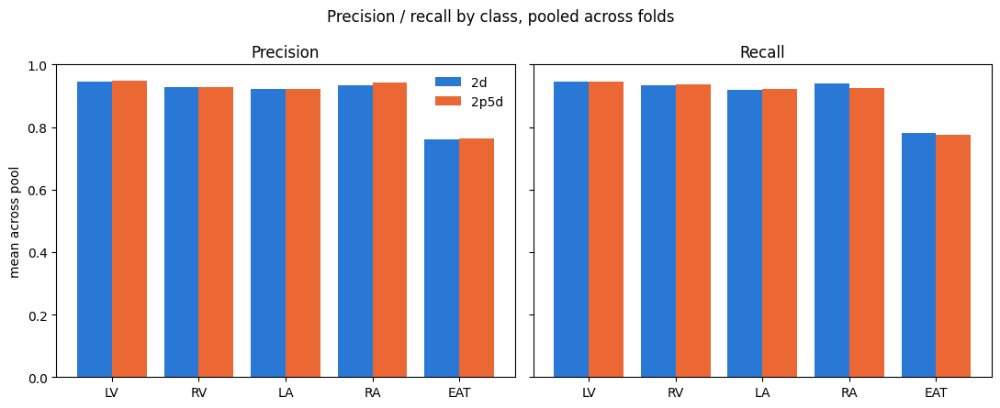

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/precision_recall.png


In [13]:
print(f'{"class":<8}' + ''.join(f'{a + " precision":>20}{a + " recall":>20}' for a in ARMS))
for cls in ORDER_FIG:
    row_cells = []
    for a in ARMS:
        rows = [r for r in pooled_rows.get(a, []) if r['class_name'] == cls]
        p = np.nanmean([r['precision'] for r in rows]) if rows else float('nan')
        r_ = np.nanmean([r['recall'] for r in rows]) if rows else float('nan')
        row_cells.append(f'{p:>20.4f}{r_:>20.4f}')
    print(f'{cls:<8}' + ''.join(row_cells))

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5), sharey=True)
x = np.arange(len(ORDER_FIG))
width = 0.8 / len(ARMS)
for ax, metric, title in zip(axes, ['precision', 'recall'], ['Precision', 'Recall']):
    for i, a in enumerate(ARMS):
        vals = []
        for cls in ORDER_FIG:
            rows = [r for r in pooled_rows.get(a, []) if r['class_name'] == cls]
            vals.append(np.nanmean([r[metric] for r in rows]) if rows else np.nan)
        offset = (i - (len(ARMS) - 1) / 2) * width
        ax.bar(x + offset, vals, width, label=a, color=ARM_COLORS[a])
    ax.set_xticks(x)
    ax.set_xticklabels(ORDER_FIG)
    ax.set_title(title)
    ax.set_ylim(0, 1)
axes[0].set_ylabel('mean across pool')
axes[0].legend(frameon=False)
fig.suptitle('Precision / recall by class, pooled across folds')
fig.tight_layout()
save_path = PLOTS_DIR / 'precision_recall.png'
fig.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'saved to {save_path}')


### Size-stratified performance

Tests whether 2.5D's gain (if any) concentrates on small/hard structures --
plausible if the mechanism is genuinely "extra context helps resolve thin or
partial-volume structures," and the natural question given EAT (diffuse,
low-contrast, and small relative to the four chambers) is the structure that
motivated this whole experiment. Pairs each (patient, class) between 2.5D and
the 2D baseline -- same pairing logic `compare_runs` uses internally -- and
correlates ground-truth structure size (mL, from `gt_voxels` * `voxel_ml`,
already columns in every per-patient CSV) against the Dice difference.

2p5d vs 2d -- Spearman(size, Dice gain): rho=0.040, p=0.5657 (n=210 patient x class pairs)


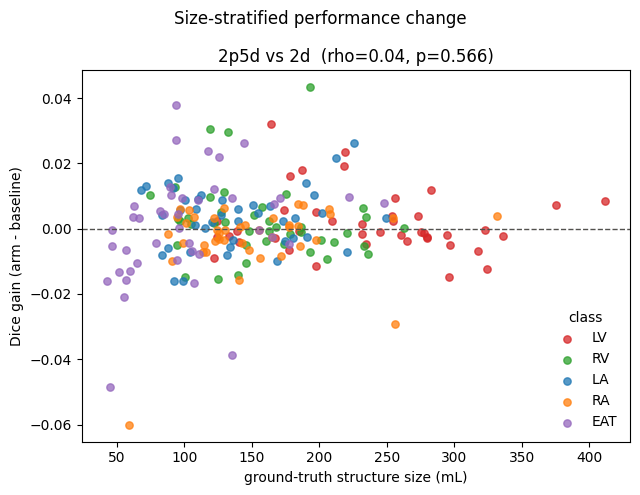

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/size_stratified_gain.png
Negative rho -> smaller structures gain more from 2.5D context relative to 2D.


In [14]:
from scipy.stats import spearmanr

def size_stratified_gain(rows_a, rows_b, metric='dice'):
    a = {(r['patient_id'], r['class_name']): r for r in rows_a}
    b = {(r['patient_id'], r['class_name']): r for r in rows_b}
    shared = sorted(set(a) & set(b))
    sizes, gains, classes = [], [], []
    for k in shared:
        ra, rb = a[k], b[k]
        if not (np.isfinite(ra[metric]) and np.isfinite(rb[metric])):
            continue
        sizes.append(ra['gt_voxels'] * ra['voxel_ml'])
        gains.append(rb[metric] - ra[metric])
        classes.append(k[1])
    return np.array(sizes), np.array(gains), classes


# same class-color mapping as show_slice / the auto-saved best/worst-slice
# PNGs every run already produces -- kept consistent across the notebook
class_colors = {'LV': 'tab:red', 'RV': 'tab:green', 'LA': 'tab:blue',
                'RA': 'tab:orange', 'EAT': 'tab:purple'}

other_arms = [a for a in ARMS if a != BASELINE_ARM]
fig, axes = plt.subplots(1, len(other_arms), figsize=(6.5 * len(other_arms), 5), sharey=True)
axes = np.atleast_1d(axes)

any_plotted = False
for ax, arm in zip(axes, other_arms):
    sizes, gains, classes = size_stratified_gain(pooled_rows.get(BASELINE_ARM, []), pooled_rows.get(arm, []))
    if len(sizes) <= 2:
        ax.set_title(f'{arm}: not enough shared pairs yet')
        continue
    any_plotted = True
    rho, p = spearmanr(sizes, gains)
    print(f'{arm} vs {BASELINE_ARM} -- Spearman(size, Dice gain): rho={rho:.3f}, p={p:.4f} '
          f'(n={len(sizes)} patient x class pairs)')
    for cls in ORDER_FIG:
        mask = np.array(classes) == cls
        ax.scatter(sizes[mask], gains[mask], color=class_colors[cls], label=cls, s=28, alpha=0.75)
    ax.axhline(0, color='#52514e', linewidth=1, linestyle='--')
    ax.set_xlabel('ground-truth structure size (mL)')
    ax.set_title(f'{arm} vs {BASELINE_ARM}  (rho={rho:.2f}, p={p:.3f})')

axes[0].set_ylabel('Dice gain (arm - baseline)')
if any_plotted:
    axes[-1].legend(frameon=False, title='class')
    fig.suptitle('Size-stratified performance change')
    fig.tight_layout()
    save_path = PLOTS_DIR / 'size_stratified_gain.png'
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'saved to {save_path}')
    print('Negative rho -> smaller structures gain more from 2.5D context relative to 2D.')
else:
    print('Not enough shared (patient, class) pairs yet -- wait for more folds to finish.')


### Slice-position performance profile

Whether performance systematically drops at the terminal (first/last) slices
of a volume, or holds steady through the middle. This is also where 2.5D is
structurally weakest -- `_neighbor_indices` edge-replicates at the volume
boundary (see `utils/data_loading.py`), so the terminal slices' "extra
context" is partly duplicated copies of themselves rather than genuinely new
information. `position` is normalized per patient (0 = first slice, 1 = last)
by `pool_slice_table` above. Both arms overlaid on one figure.

/tmp/ipykernel_8222/4068009043.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(run_dir_for(run_name) / 'best.pth', map_location=device)


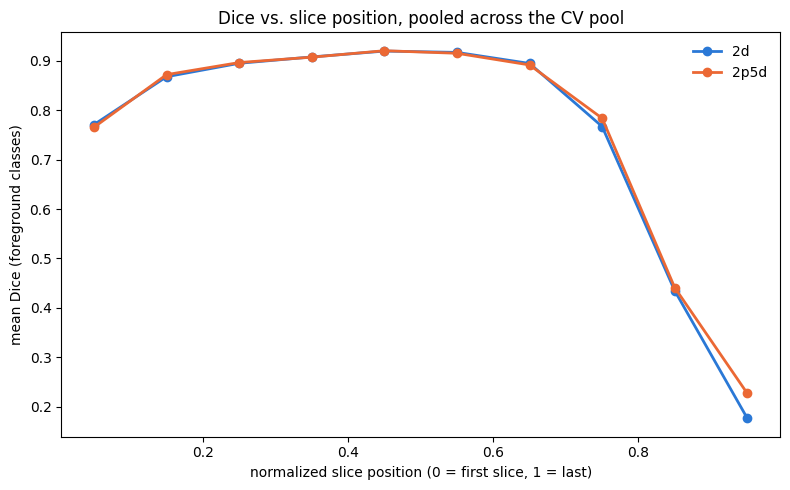

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slice_position_profile.png


In [15]:
def position_profile(arm, n_bins=10):
    table = pool_slice_table(arm)
    if not table:
        return None
    positions = np.array([r['position'] for r in table])
    dices = np.array([r['dice'] for r in table])
    bin_edges = np.linspace(0, 1, n_bins + 1)
    bin_idx = np.clip(np.digitize(positions, bin_edges) - 1, 0, n_bins - 1)
    means = [dices[bin_idx == b].mean() if (bin_idx == b).any() else np.nan for b in range(n_bins)]
    counts = [int((bin_idx == b).sum()) for b in range(n_bins)]
    centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    return centers, means, counts


fig, ax = plt.subplots(figsize=(8, 5))
any_plotted = False
for arm in ARMS:
    profile = position_profile(arm)
    if profile is None:
        print(f'{arm}: no fold has finished yet, skipped')
        continue
    any_plotted = True
    centers, means, counts = profile
    ax.plot(centers, means, marker='o', color=ARM_COLORS[arm], linewidth=2, markersize=6, label=arm)

if any_plotted:
    ax.set_xlabel('normalized slice position (0 = first slice, 1 = last)')
    ax.set_ylabel('mean Dice (foreground classes)')
    ax.set_title(f'Dice vs. slice position, pooled across the CV pool')
    ax.legend(frameon=False)
    fig.tight_layout()
    save_path = PLOTS_DIR / 'slice_position_profile.png'
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'saved to {save_path}')
else:
    print('No arm has any finished folds yet -- nothing to plot.')


### Uncertainty summary (per patient/class mean entropy)

A scalar per (patient, class) -- mean predictive entropy within the region
the model actually predicted as that class -- so it can sit in the same
tables as dice/precision/recall rather than only existing as a picture.
Useful as a quick check of whether high uncertainty tracks low Dice
(expected) or whether one arm is confidently wrong (a worse sign than being
unsure). If 2.5D's extra context genuinely resolves ambiguous cases, its
entropy should drop on the same patients/classes where its Dice rises.

In [16]:
for arm in ARMS:
    entropy_rows = pool_entropy_by_class(arm)
    if not entropy_rows:
        print(f'{arm}: no fold has finished yet, skipped\n')
        continue
    dice_by_key = {(r['patient_id'], r['class_name']): r['dice'] for r in pooled_rows.get(arm, [])}

    print(f'=== {arm} ===')
    print(f'{"class":<8}{"mean entropy":>16}{"n":>6}')
    by_class = defaultdict(list)
    for r in entropy_rows:
        if np.isfinite(r['mean_entropy']):
            by_class[r['class_name']].append(r['mean_entropy'])
    for cls in ORDER_FIG:
        vals = by_class.get(cls, [])
        if vals:
            print(f'{cls:<8}{np.mean(vals):>16.4f}{len(vals):>6}')

    paired = [(dice_by_key[(r['patient_id'], r['class_name'])], r['mean_entropy'])
             for r in entropy_rows
             if (r['patient_id'], r['class_name']) in dice_by_key and np.isfinite(r['mean_entropy'])]
    if len(paired) > 2:
        dices_, entropies_ = zip(*paired)
        rho, p = spearmanr(dices_, entropies_)
        print(f'Spearman correlation, Dice vs mean entropy: rho={rho:.3f}, p={p:.4f}  (n={len(paired)})')
    print()

print('Expected: negative rho for every arm (lower Dice where the model is also less confident). '
     'A near-zero or positive rho would mean that arm is confidently wrong somewhere.')


=== 2d ===
class       mean entropy     n
LV                0.0465    42
RV                0.0559    42
LA                0.0571    42
RA                0.0544    42
EAT               0.1795    42
Spearman correlation, Dice vs mean entropy: rho=-0.798, p=0.0000  (n=210)

=== 2p5d ===
class       mean entropy     n
LV                0.0457    42
RV                0.0529    42
LA                0.0530    42
RA                0.0540    42
EAT               0.1757    42
Spearman correlation, Dice vs mean entropy: rho=-0.752, p=0.0000  (n=210)

Expected: negative rho for every arm (lower Dice where the model is also less confident). A near-zero or positive rho would mean that arm is confidently wrong somewhere.


## Diagnostics (Tier 3): visualize predictions across the pool

Qualitative/visual checks -- the setup (model loading, prediction, entropy,
caching) already happened in the shared setup section near the top of this
notebook; everything below just uses it.

### Global worst/best slices, pooled across the whole CV set

Not per-fold -- across all ~42 patients at once, each scored by the model
that legitimately held them out. `ARM_TO_INSPECT` picks which arm's own
predictions rank the slices; the drill-in below then shows both arms side by
side on whichever slices come out worst for it.

In [17]:
def pool_slice_ranking(arm):
    """Worst-to-best slices across the pool, built from pool_slice_table
    (predictions are cached, so this is free if the table was already computed
    for this arm elsewhere in the notebook). Returns (score, patient_id,
    slice_idx, fold) tuples."""
    table = pool_slice_table(arm)
    entries = [(r['dice'], r['patient_id'], r['slice_idx'], r['fold']) for r in table]
    entries.sort(key=lambda e: e[0])
    return entries


ARM_TO_INSPECT = '2p5d'   # <- swap for '2d' to inspect the baseline instead

ranking = pool_slice_ranking(ARM_TO_INSPECT)
if not ranking:
    print(f'No fold has finished for {ARM_TO_INSPECT} yet.')
else:
    print(f'worst 6 slices, pooled across the CV set ({ARM_TO_INSPECT}):')
    for score, pid, s, fold in ranking[:6]:
        print(f'  {score:.3f}  {pid:<20} slice {s:<4} (fold {fold})')

    print(f'\nbest 6 slices:')
    for score, pid, s, fold in ranking[-6:][::-1]:
        print(f'  {score:.3f}  {pid:<20} slice {s:<4} (fold {fold})')


worst 6 slices, pooled across the CV set (2p5d):
  0.000  CADRE_1116_second    slice 0    (fold 4)
  0.000  CADRE_1131           slice 67   (fold 1)
  0.000  CADRE_1131           slice 68   (fold 1)
  0.000  CADRE_1131           slice 69   (fold 1)
  0.000  CADRE_1131           slice 70   (fold 1)
  0.000  CADRE_1131           slice 71   (fold 1)

best 6 slices:
  0.970  CADRE_1857           slice 48   (fold 0)
  0.966  CADRE_1645           slice 40   (fold 3)
  0.965  CADRE_1645           slice 41   (fold 3)
  0.965  CADRE_1645           slice 39   (fold 3)
  0.964  CADRE_1645           slice 42   (fold 3)
  0.964  CADRE_1404_second    slice 32   (fold 1)


### Drill in: ground truth vs. one or both arms, side by side

`show_slice` takes a dict of `{label: arm}` -- pass one arm to just look at
its predictions, or both (e.g. `ALL_ARMS`) to see exactly how the context
window changed a specific case. Every panel uses the SAME fold's model for a
given patient (fold membership doesn't depend on the arm), so any visible
difference is attributable to `context_slices`, not to a different train/val
split. Entropy panels roughly double the figure width per arm shown, so the
worst-slice sweep below defaults to both arms without entropy, and the
terminal-slice section further down uses entropy for the closer look.

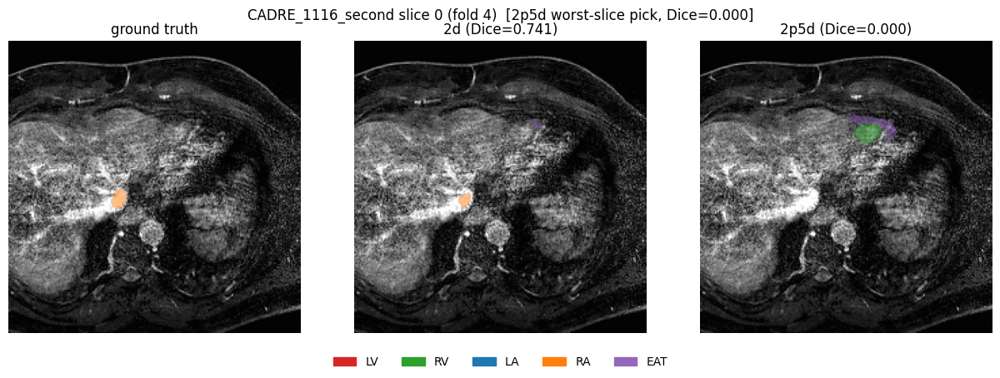

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1116_second_slice0_2d-2p5d.png


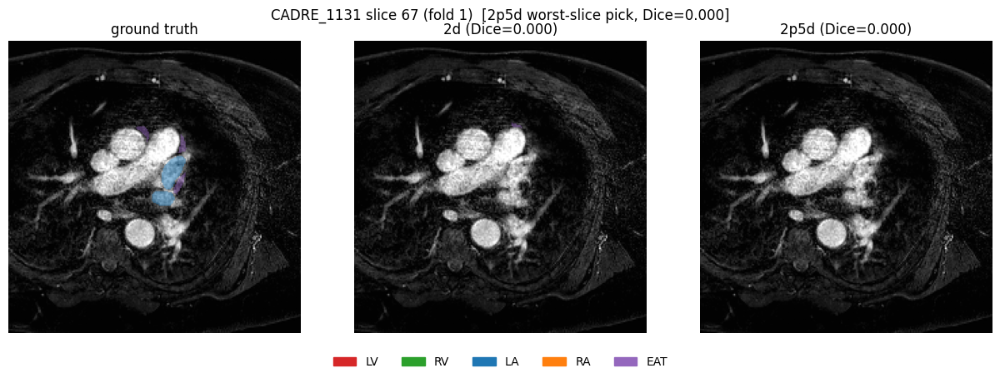

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice67_2d-2p5d.png


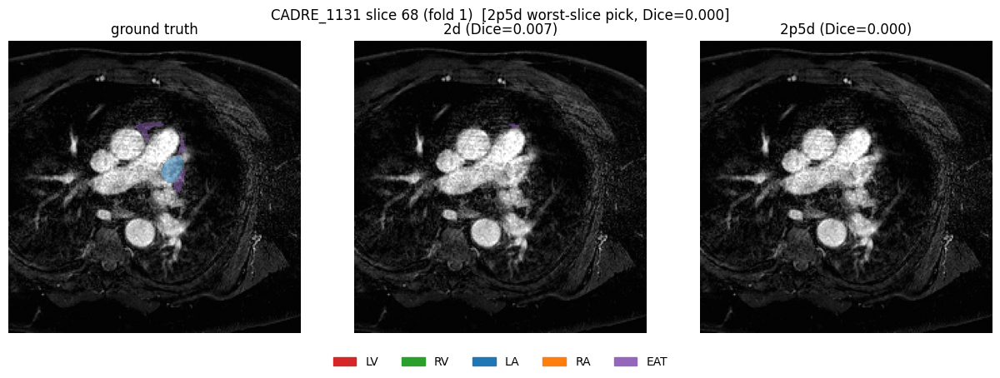

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice68_2d-2p5d.png


In [18]:
def show_slice(patient_id, slice_idx, arms, title_extra='', show_entropy=False):
    """Plot ground truth + one prediction panel per arm for one slice, and
    optionally an entropy heatmap panel per arm. `arms` is {label: arm_key}.
    """
    from matplotlib.colors import ListedColormap
    from matplotlib.patches import Patch

    colors = ['none', 'tab:red', 'tab:green', 'tab:blue', 'tab:orange', 'tab:purple']
    cmap = ListedColormap(colors[:N_CLASSES])
    class_names = train.PHASE_CLASS_NAMES[PHASE]

    preds, entropies, gt, fold = {}, {}, None, None
    for label, arm in arms.items():
        pred_vol, gt_vol, entropy_vol, f = predict_patient(patient_id, arm)
        preds[label] = pred_vol[slice_idx]
        entropies[label] = entropy_vol[slice_idx]
        gt, fold = gt_vol[slice_idx], f

    ordered = sorted(_PATIENT_IDXS[patient_id], key=lambda i: dataset.index[i][1])
    # canonical (context_slices=0) dataset -- plain water-phase slice for display;
    # each arm's own windowed input (fed to its model above) is invisible here
    img = dataset[ordered[slice_idx]]['image'].numpy()[0]

    n_panels = 1 + len(arms) * (2 if show_entropy else 1)
    fig, axes = plt.subplots(1, n_panels, figsize=(4.2 * n_panels, 4.5))
    axes = np.atleast_1d(axes)

    axes[0].imshow(img, cmap='gray')
    axes[0].imshow(np.ma.masked_equal(gt, 0), cmap=cmap, vmin=0, vmax=N_CLASSES - 1, alpha=0.5)
    axes[0].set_title('ground truth')
    axes[0].axis('off')

    col = 1
    for label, pred in preds.items():
        ax = axes[col]
        ax.imshow(img, cmap='gray')
        ax.imshow(np.ma.masked_equal(pred, 0), cmap=cmap, vmin=0, vmax=N_CLASSES - 1, alpha=0.5)
        dice_here = np.nanmean([metrics.dice_binary(pred == c, gt == c) for c in range(1, N_CLASSES)])
        ax.set_title(f'{label} (Dice={dice_here:.3f})')
        ax.axis('off')
        col += 1

    if show_entropy:
        for label, ent in entropies.items():
            ax = axes[col]
            ax.imshow(img, cmap='gray')
            # sequential single-hue colormap for magnitude (uncertainty), not a rainbow
            im = ax.imshow(ent, cmap='viridis', alpha=0.6, vmin=0)
            ax.set_title(f'{label} entropy')
            ax.axis('off')
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            col += 1

    handles = [Patch(color=colors[c], label=class_names.get(c, f'class_{c}')) for c in range(1, N_CLASSES)]
    fig.legend(handles=handles, loc='lower center', ncol=len(handles), frameon=False)
    fig.suptitle(f'{patient_id} slice {slice_idx} (fold {fold}){title_extra}')
    fig.tight_layout(rect=(0, 0.08, 1, 1))

    tag = '-'.join(arms) + ('_entropy' if show_entropy else '')
    save_path = SLICES_DIR / f'{patient_id}_slice{slice_idx}_{tag}.png'
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'saved to {save_path}')
    return save_path


# both arms, label == arm name (no separate display names needed for a 2-arm comparison)
ALL_ARMS = {arm: arm for arm in ARMS}

# example: worst few slices found above, both arms side by side, no entropy
if ranking:
    for score, pid, s, fold in ranking[:3]:
        show_slice(pid, s, ALL_ARMS,
                  title_extra=f'  [{ARM_TO_INSPECT} worst-slice pick, Dice={score:.3f}]')


### Terminal-slice failure inspection

Filters the same per-slice table to just the first/last 15% of each
patient's volume. This is exactly where 2.5D is expected to be weakest (see
the slice-position profile note above): `_neighbor_indices` edge-replicates
at the volume boundary, so the "extra" slices a terminal-slice prediction
sees are partly duplicates of the slice itself rather than new information.
If 2.5D's gain (if any) evaporates specifically in this band, that's the
mechanism; if it holds up here too, the model is getting real signal even
from a mostly-duplicated window.

terminal slices (position <= 0.15 or >= 0.85): 700 slices, mean Dice = 0.6941
interior slices:                                          2636 slices, mean Dice = 0.8688

worst 3 terminal slices:
  0.000  CADRE_1116_second    slice 0    (position 0.00, fold 4)
  0.000  CADRE_1382_first     slice 86   (position 0.92, fold 1)
  0.000  CADRE_1382_second    slice 86   (position 0.92, fold 0)


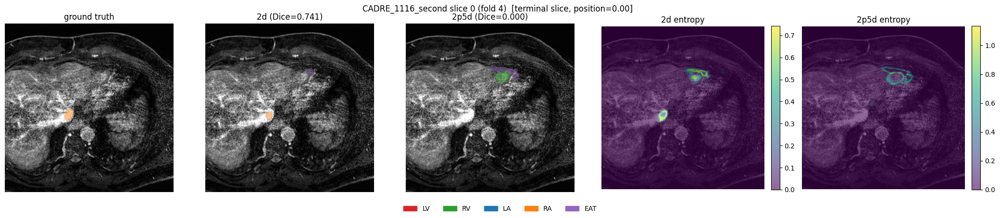

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1116_second_slice0_2d-2p5d_entropy.png


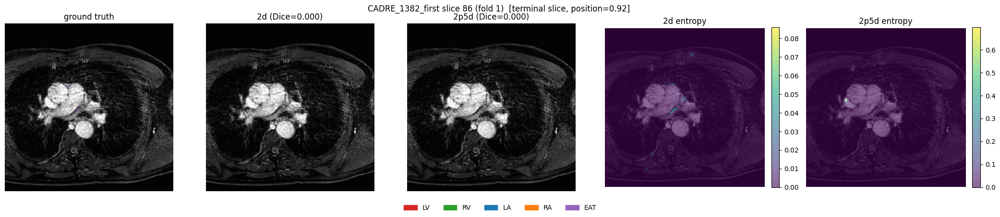

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_first_slice86_2d-2p5d_entropy.png


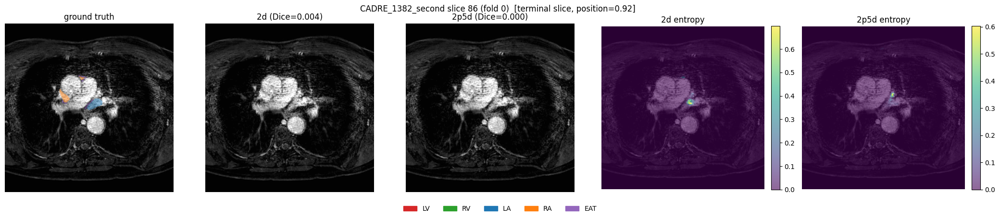

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_second_slice86_2d-2p5d_entropy.png


In [19]:
EDGE_BAND = 0.15   # slices within this fraction of either end count as "terminal"

table = pool_slice_table(ARM_TO_INSPECT)
if not table:
    print(f'No fold has finished for {ARM_TO_INSPECT} yet.')
else:
    terminal = [r for r in table if r['position'] <= EDGE_BAND or r['position'] >= 1 - EDGE_BAND]
    interior = [r for r in table if EDGE_BAND < r['position'] < 1 - EDGE_BAND]

    print(f'terminal slices (position <= {EDGE_BAND} or >= {1 - EDGE_BAND}): '
          f'{len(terminal)} slices, mean Dice = {np.mean([r["dice"] for r in terminal]):.4f}')
    print(f'interior slices:                                          '
          f'{len(interior)} slices, mean Dice = {np.mean([r["dice"] for r in interior]):.4f}')

    worst_terminal = sorted(terminal, key=lambda r: r['dice'])[:3]
    print(f'\nworst 3 terminal slices:')
    for r in worst_terminal:
        print(f'  {r["dice"]:.3f}  {r["patient_id"]:<20} slice {r["slice_idx"]:<4} '
             f'(position {r["position"]:.2f}, fold {r["fold"]})')
    compare_pair = {BASELINE_ARM: BASELINE_ARM, ARM_TO_INSPECT: ARM_TO_INSPECT}
    for r in worst_terminal:
        show_slice(r['patient_id'], r['slice_idx'], compare_pair,
                  title_extra=f'  [terminal slice, position={r["position"]:.2f}]', show_entropy=True)


### EAT-focused slice inspection: water + fat phase, GT, both arms

EAT was consistently the worst-performing structure across every loss arm in
`both_phase_loss_ablation_kfold_diagnostics.ipynb` (Dice ~0.75-0.77 vs 0.92+
for the four chambers) and didn't move much with the loss choice -- the
notebook's own conclusion was that the bottleneck looked more like a
structure-level (diffuse, low-contrast, fat-phase-only) limitation than
something a loss function could fix. This section is where that gets tested
directly against 2.5D instead.

Ranks slices by **EAT's own Dice**, not the mean-over-classes Dice
`pool_slice_ranking` above uses. For each worst slice it shows both input
channels (`water_img`, `fat_img`) plus ground truth and both arms'
predictions, with each arm's title reporting its own EAT Dice for that slice
specifically.

worst 8 EAT slices, pooled across the CV set (ranked by 2d EAT Dice):
  0.000  CADRE_1131           slice 67   (fold 1)
  0.000  CADRE_1131           slice 69   (fold 1)
  0.000  CADRE_1131           slice 70   (fold 1)
  0.000  CADRE_1131           slice 71   (fold 1)
  0.000  CADRE_1382_first     slice 85   (fold 1)
  0.000  CADRE_1382_first     slice 86   (fold 1)
  0.000  CADRE_1382_second    slice 85   (fold 0)
  0.000  CADRE_1382_second    slice 86   (fold 0)


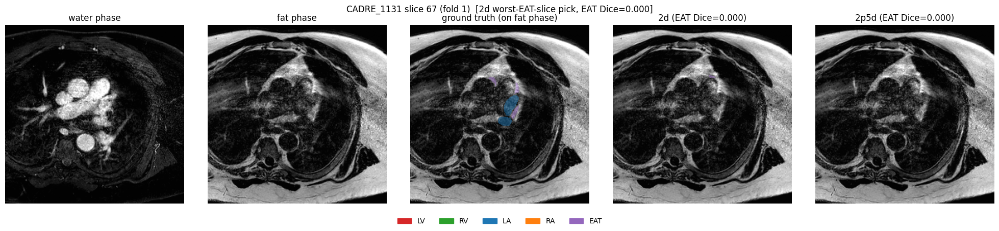

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice67_2d-2p5d_eat.png


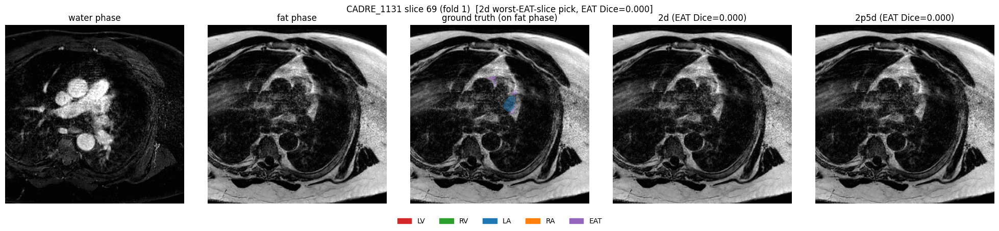

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice69_2d-2p5d_eat.png


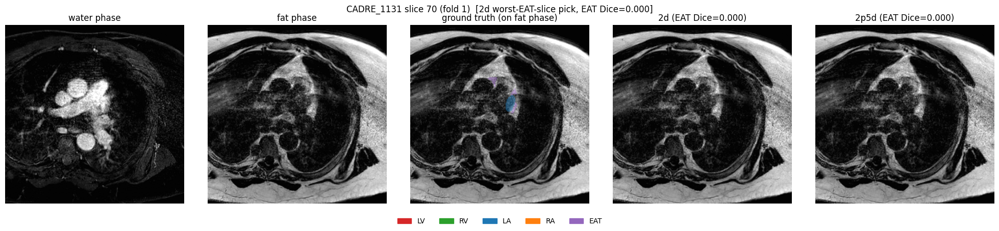

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice70_2d-2p5d_eat.png


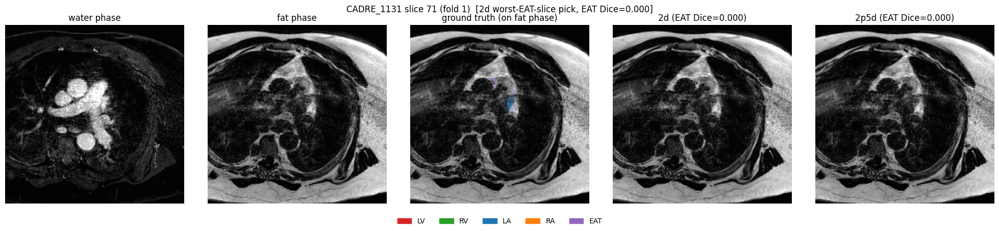

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice71_2d-2p5d_eat.png


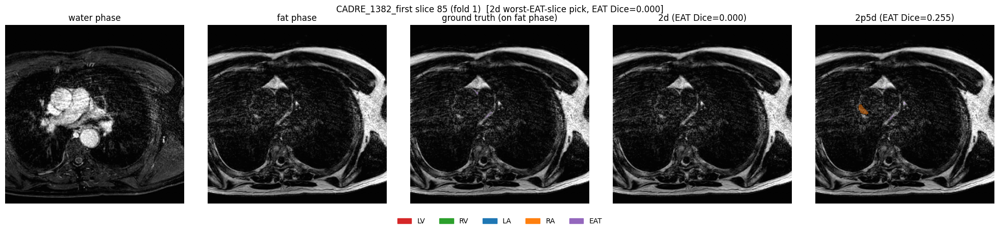

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_first_slice85_2d-2p5d_eat.png


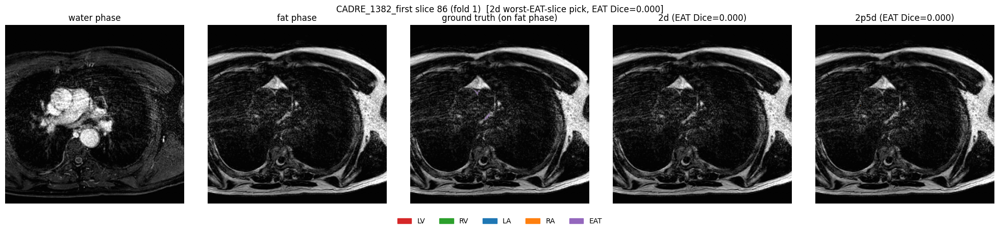

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_first_slice86_2d-2p5d_eat.png


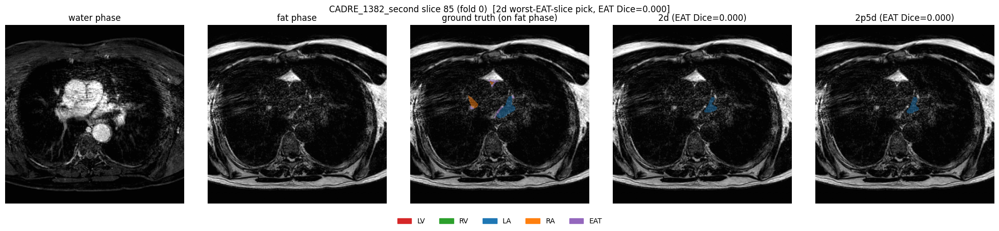

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_second_slice85_2d-2p5d_eat.png


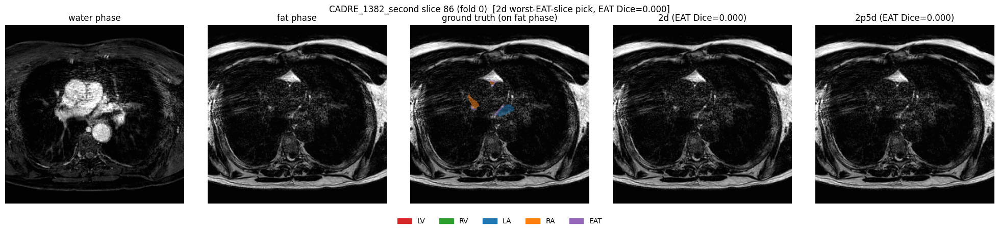

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_second_slice86_2d-2p5d_eat.png


In [20]:
EAT_CLS = 5   # BOTH_CLASS_NAMES[5] == 'EAT' -- see train.py
N_EAT_SLICES = 8   # how many worst-EAT-Dice slices to pull up
EAT_RANK_ARM = BASELINE_ARM   # <- rank by the 2D baseline's failures; both arms still shown side by side


def pool_class_slice_ranking(arm, cls):
    """Worst-to-best slices for ONE class, pooled across the CV set -- unlike
    pool_slice_ranking (mean Dice over every foreground class), this ranks by
    cls's own Dice, so a slice with fine overall Dice but bad EAT specifically
    still surfaces."""
    entries = []
    for patient_id in sorted(_FOLD_OF):
        if not fold_ready(arm, _FOLD_OF[patient_id]):
            continue
        pred_vol, gt_vol, _, fold = predict_patient(patient_id, arm)
        for s in range(pred_vol.shape[0]):
            gt_slice = gt_vol[s]
            if not (gt_slice == cls).any():
                continue
            d = metrics.dice_binary(pred_vol[s] == cls, gt_slice == cls)
            if np.isfinite(d):
                entries.append((d, patient_id, s, fold))
    entries.sort(key=lambda e: e[0])
    return entries


def show_eat_slice(patient_id, slice_idx, arms, eat_cls=EAT_CLS, title_extra=''):
    """Water phase, fat phase, ground truth, and both arms' predictions for one
    slice -- built for EAT specifically, so (unlike show_slice) it shows BOTH
    input channels and reports each arm's EAT-only Dice rather than the
    mean-over-classes Dice in its panel title."""
    from matplotlib.colors import ListedColormap
    from matplotlib.patches import Patch

    colors = ['none', 'tab:red', 'tab:green', 'tab:blue', 'tab:orange', 'tab:purple']
    cmap = ListedColormap(colors[:N_CLASSES])
    class_names = train.PHASE_CLASS_NAMES[PHASE]

    preds, gt, fold = {}, None, None
    for label, arm in arms.items():
        pred_vol, gt_vol, _, f = predict_patient(patient_id, arm)
        preds[label] = pred_vol[slice_idx]
        gt, fold = gt_vol[slice_idx], f

    ordered = sorted(_PATIENT_IDXS[patient_id], key=lambda i: dataset.index[i][1])
    img = dataset[ordered[slice_idx]]['image'].numpy()   # (2, H, W): water, fat
    water_img, fat_img = img[0], img[1]

    n_panels = 2 + 1 + len(arms)   # water, fat, GT, one per arm
    fig, axes = plt.subplots(1, n_panels, figsize=(4.0 * n_panels, 4.5))
    axes = np.atleast_1d(axes)

    axes[0].imshow(water_img, cmap='gray')
    axes[0].set_title('water phase')
    axes[0].axis('off')

    axes[1].imshow(fat_img, cmap='gray')
    axes[1].set_title('fat phase')
    axes[1].axis('off')

    axes[2].imshow(fat_img, cmap='gray')
    axes[2].imshow(np.ma.masked_equal(gt, 0), cmap=cmap, vmin=0, vmax=N_CLASSES - 1, alpha=0.5)
    axes[2].set_title('ground truth (on fat phase)')
    axes[2].axis('off')

    col = 3
    for label, pred in preds.items():
        ax = axes[col]
        ax.imshow(fat_img, cmap='gray')
        ax.imshow(np.ma.masked_equal(pred, 0), cmap=cmap, vmin=0, vmax=N_CLASSES - 1, alpha=0.5)
        eat_dice = metrics.dice_binary(pred == eat_cls, gt == eat_cls)
        ax.set_title(f'{label} (EAT Dice={eat_dice:.3f})')
        ax.axis('off')
        col += 1

    handles = [Patch(color=colors[c], label=class_names.get(c, f'class_{c}')) for c in range(1, N_CLASSES)]
    fig.legend(handles=handles, loc='lower center', ncol=len(handles), frameon=False)
    fig.suptitle(f'{patient_id} slice {slice_idx} (fold {fold}){title_extra}')
    fig.tight_layout(rect=(0, 0.08, 1, 1))

    tag = '-'.join(arms) + '_eat'
    save_path = SLICES_DIR / f'{patient_id}_slice{slice_idx}_{tag}.png'
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'saved to {save_path}')
    return save_path


eat_ranking = pool_class_slice_ranking(EAT_RANK_ARM, EAT_CLS)
if not eat_ranking:
    print(f'No fold has finished for {EAT_RANK_ARM} yet.')
else:
    print(f'worst {N_EAT_SLICES} EAT slices, pooled across the CV set (ranked by {EAT_RANK_ARM} EAT Dice):')
    for score, pid, s, fold in eat_ranking[:N_EAT_SLICES]:
        print(f'  {score:.3f}  {pid:<20} slice {s:<4} (fold {fold})')

    for score, pid, s, fold in eat_ranking[:N_EAT_SLICES]:
        show_eat_slice(pid, s, ALL_ARMS,
                       title_extra=f'  [{EAT_RANK_ARM} worst-EAT-slice pick, EAT Dice={score:.3f}]')


### The direct test: does 2.5D actually fix the slices 2D got wrong?

This is the payoff of the whole notebook. `both_phase_loss_ablation_kfold_diagnostics.ipynb`'s
neighborhood analysis found that on many of 2D's worst EAT failures, EAT was
visible in the immediately neighboring slice(s) -- exactly the information a
2.5D model has access to and a 2D model structurally cannot. Two checks,
using the SAME worst-2D-EAT-slice list as that notebook:

1. **Neighborhood gap, per arm separately** (carried over from the sibling
notebook): for each arm, does its own center-slice EAT Dice lag behind the
mean EAT Dice of its immediate neighbors? A large gap for 2D, shrinking for
2.5D, would mean 2.5D is using exactly the information the neighborhood
analysis flagged as available.
2. **2D vs 2.5D center-slice EAT Dice, directly** -- new in this notebook,
not in the sibling: on the exact slices where 2D failed, does 2.5D's own
prediction on that same slice actually score higher? This is the most direct
possible test of the hypothesis, independent of the neighborhood-gap framing.

Every arm is shown at every neighboring slice in the visualization below, not
just the ranking arm -- if both arms fail similarly at the center slice, that
points away from a missing-context explanation regardless of what the
quantitative gap says.

1) neighborhood gap across the worst 6 EAT slices (ranked by 2d):

patient              slice   arm       center  neighbors      gap
CADRE_1131              67   2d         0.000      0.117   +0.117
                             2p5d       0.000      0.015   +0.015

CADRE_1131              69   2d         0.000      0.003   +0.003
                             2p5d       0.000      0.000   +0.000

CADRE_1131              70   2d         0.000      0.005   +0.005
                             2p5d       0.000      0.000   +0.000

CADRE_1131              71   2d         0.000      0.000   +0.000
                             2p5d       0.000      0.000   +0.000

CADRE_1382_first        85   2d         0.000      0.200   +0.200
                             2p5d       0.255      0.280   +0.024

CADRE_1382_first        86   2d         0.000      0.118   +0.118
                             2p5d       0.000      0.359   +0.359

2d: mean neighborhood gap = +0.074  -- 3/6 slices have neighbors >0.1

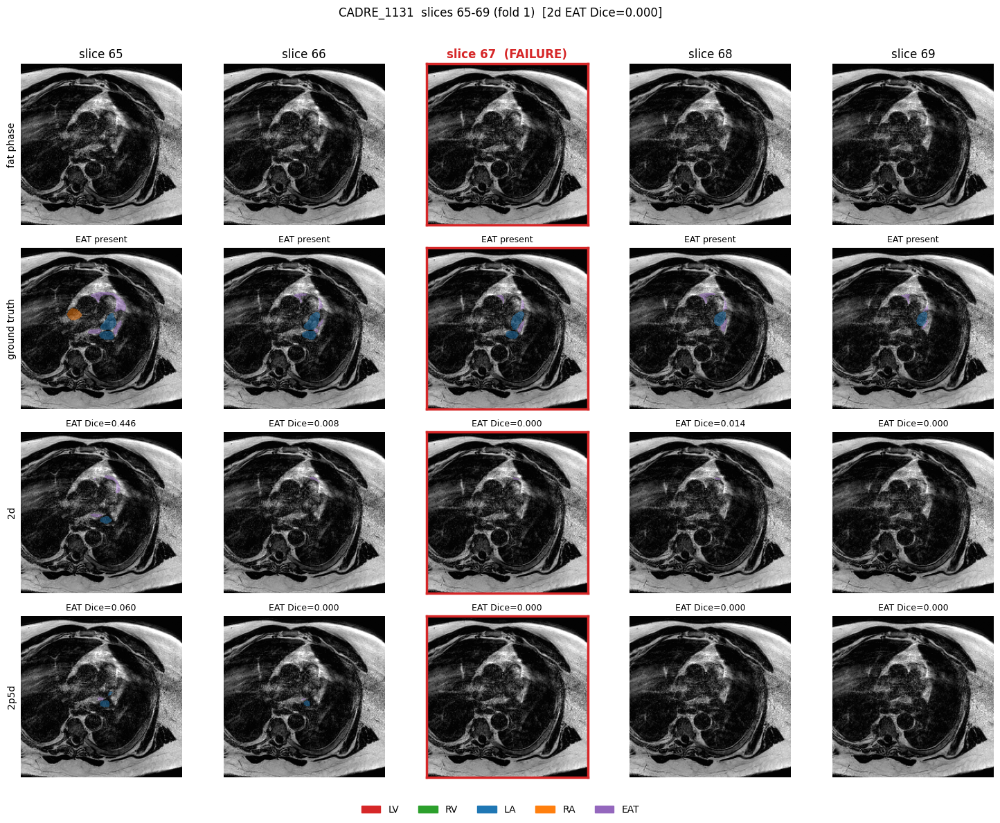

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice67_eat_neighborhood.png


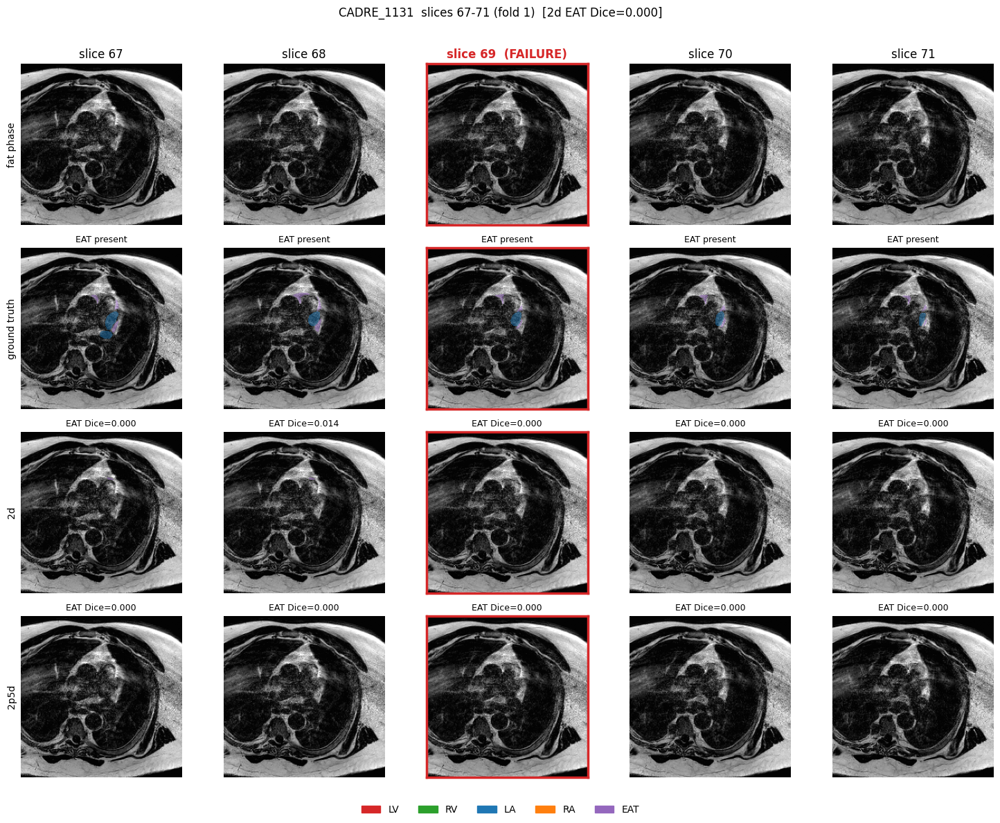

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice69_eat_neighborhood.png


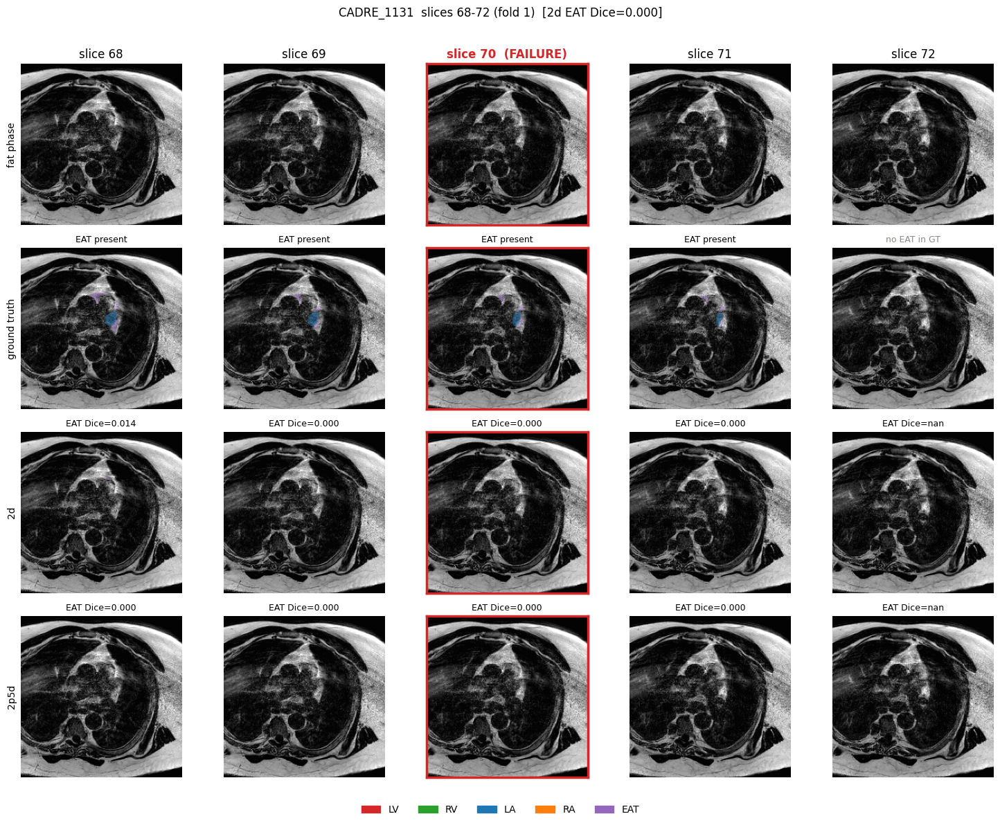

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice70_eat_neighborhood.png


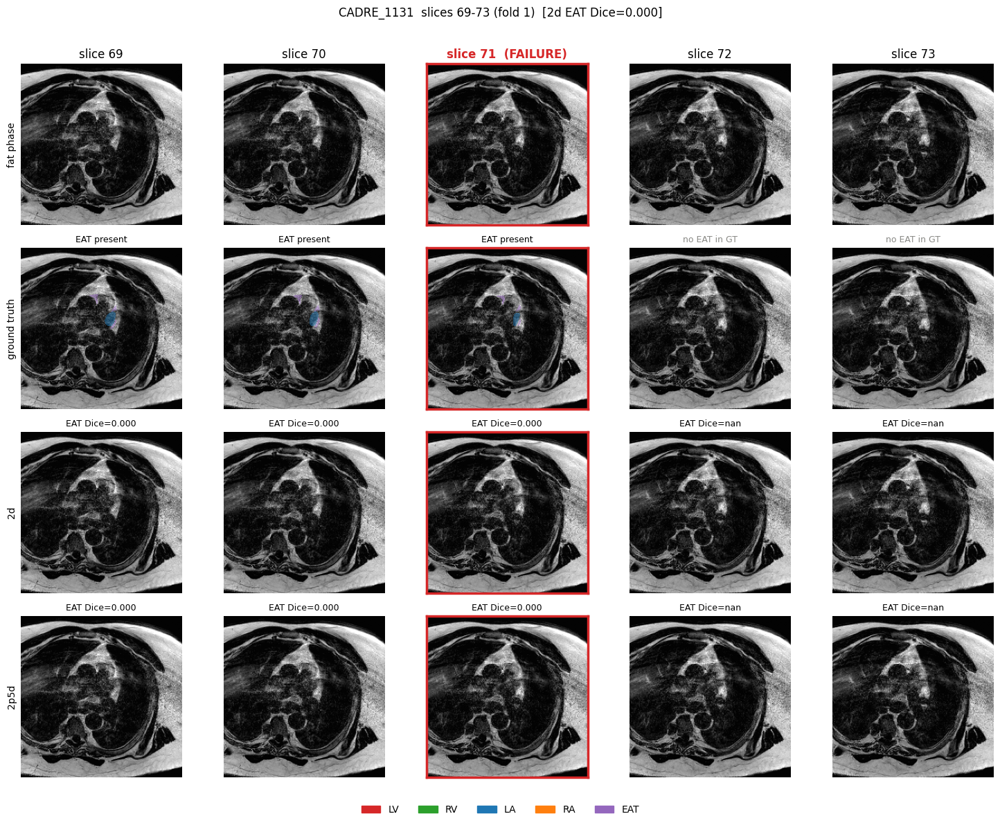

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1131_slice71_eat_neighborhood.png


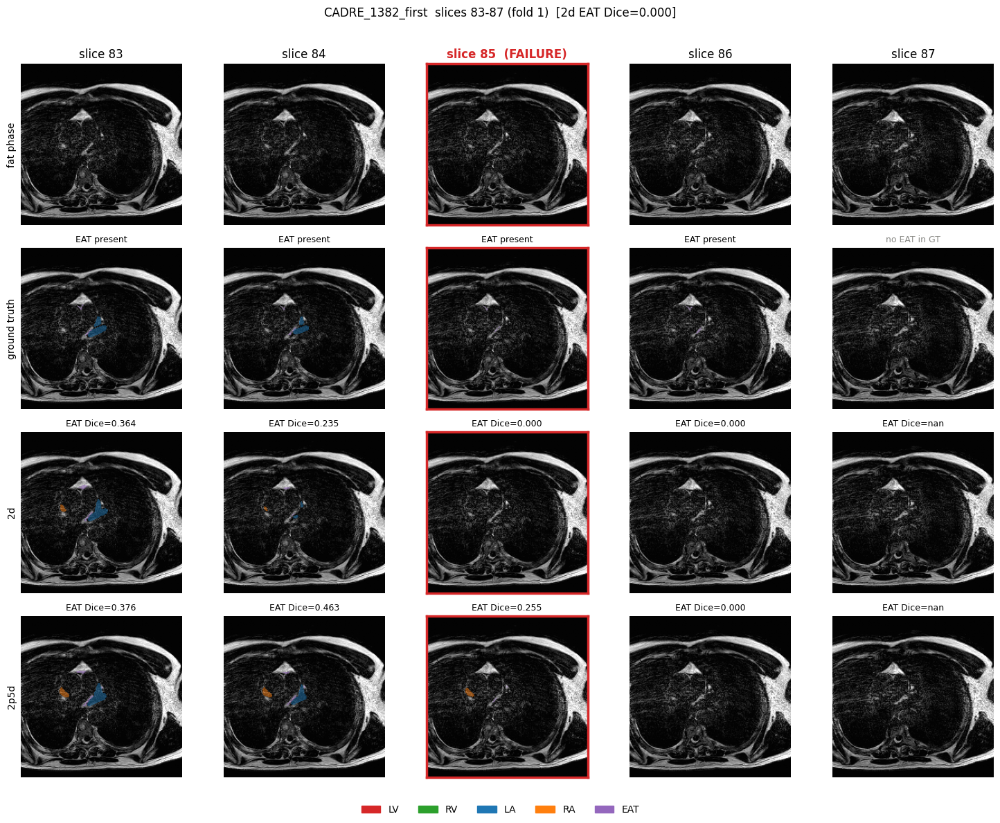

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_first_slice85_eat_neighborhood.png


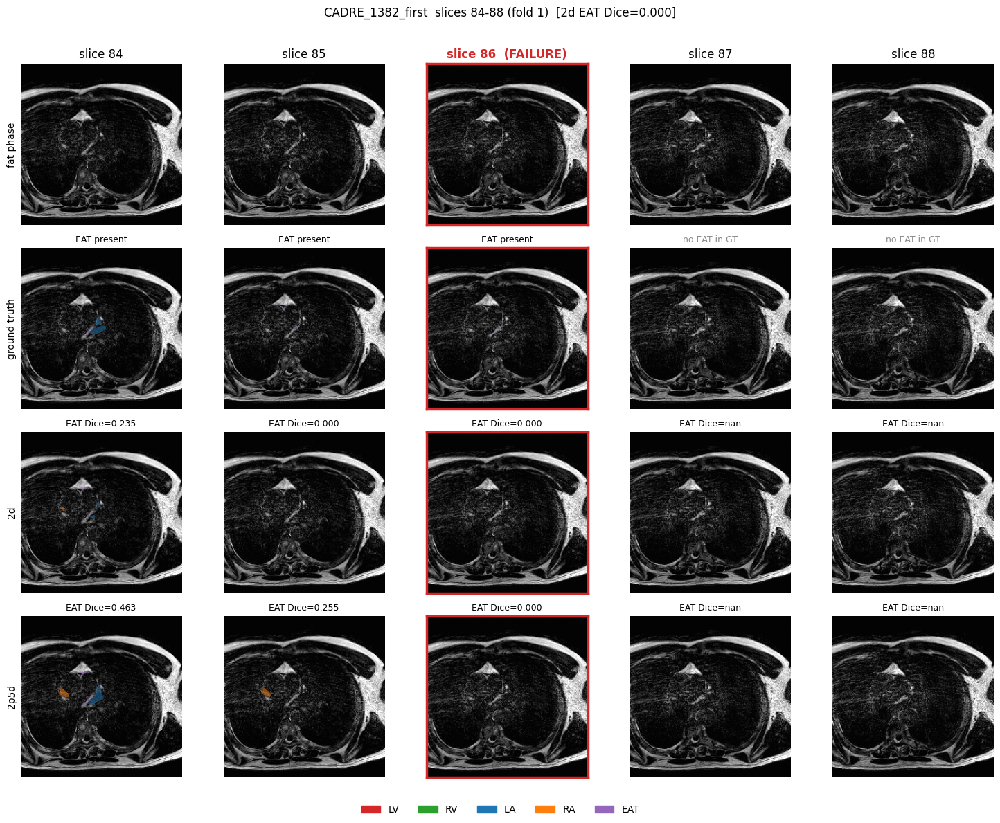

saved to checkpoints/both_2d_vs_2p5d_kfold_pooled/plots/slices/CADRE_1382_first_slice86_eat_neighborhood.png


In [21]:
EAT_NEIGHBOR_WINDOW = 2   # slices on each side of the worst slice to include
NEIGHBORHOOD_ARM = EAT_RANK_ARM   # <- which arm's ranking picks the "worst" slices; both arms still shown in the grid
N_EAT_NEIGHBORHOOD_SWEEP = 6   # how many worst EAT slices to walk through, not just #1 -- a single
                               # case is anecdotal, a repeated pattern across several is evidence


def show_eat_slice_neighborhood(patient_id, center_slice, arms, eat_cls=EAT_CLS,
                                 window=EAT_NEIGHBOR_WINDOW, title_extra=''):
    """Fat phase, ground truth, and both arms' predictions across a small window
    of consecutive slices centered on one EAT failure. Predictions are read out
    of the cached whole-volume predict_patient() call per arm, so this costs no
    extra forward passes beyond what's already run."""
    from matplotlib.colors import ListedColormap
    from matplotlib.patches import Patch

    colors = ['none', 'tab:red', 'tab:green', 'tab:blue', 'tab:orange', 'tab:purple']
    cmap = ListedColormap(colors[:N_CLASSES])
    class_names = train.PHASE_CLASS_NAMES[PHASE]

    preds, gts, fold, n_slices = {}, {}, None, None
    for label, arm in arms.items():
        pred_vol, gt_vol, _, f = predict_patient(patient_id, arm)
        preds[label], gts[label], fold = pred_vol, gt_vol, f
        n_slices = pred_vol.shape[0]

    slice_range = [s for s in range(center_slice - window, center_slice + window + 1)
                   if 0 <= s < n_slices]
    ordered = sorted(_PATIENT_IDXS[patient_id], key=lambda i: dataset.index[i][1])
    fat_imgs = {s: dataset[ordered[s]]['image'].numpy()[1] for s in slice_range}

    first_arm = next(iter(arms))
    row_labels = ['fat phase', 'ground truth'] + list(arms)
    n_rows, n_cols = len(row_labels), len(slice_range)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.0 * n_cols, 3.0 * n_rows), squeeze=False)

    for col, s in enumerate(slice_range):
        gt_slice = gts[first_arm][s]   # ground truth is identical across arms
        panels = [('fat phase', None), ('ground truth', gt_slice)] + \
                 [(label, preds[label][s]) for label in arms]
        for row, (row_label, overlay) in enumerate(panels):
            ax = axes[row, col]
            ax.imshow(fat_imgs[s], cmap='gray')
            if overlay is not None:
                ax.imshow(np.ma.masked_equal(overlay, 0), cmap=cmap, vmin=0, vmax=N_CLASSES - 1, alpha=0.5)
            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(s == center_slice)
                if s == center_slice:
                    spine.set_edgecolor('tab:red')
                    spine.set_linewidth(2.5)
            if col == 0:
                ax.set_ylabel(row_label, fontsize=10)
            if row == 0:
                title = f'slice {s}' + ('  (FAILURE)' if s == center_slice else '')
                ax.set_title(title, fontweight='bold' if s == center_slice else 'normal',
                              color='tab:red' if s == center_slice else 'black')
            elif row == 1:
                has_eat = (gt_slice == eat_cls).any()
                ax.set_title('EAT present' if has_eat else 'no EAT in GT', fontsize=9,
                              color='black' if has_eat else '#8a8a86')
            else:
                eat_dice = metrics.dice_binary(overlay == eat_cls, gt_slice == eat_cls)
                ax.set_title(f'EAT Dice={eat_dice:.3f}', fontsize=9)

    handles = [Patch(color=colors[c], label=class_names.get(c, f'class_{c}')) for c in range(1, N_CLASSES)]
    fig.legend(handles=handles, loc='lower center', ncol=len(handles), frameon=False)
    fig.suptitle(f'{patient_id}  slices {slice_range[0]}-{slice_range[-1]} (fold {fold}){title_extra}')
    fig.tight_layout(rect=(0, 0.04, 1, 0.97))

    save_path = SLICES_DIR / f'{patient_id}_slice{center_slice}_eat_neighborhood.png'
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'saved to {save_path}')
    return save_path


def eat_neighborhood_gap(patient_id, center_slice, arms, eat_cls=EAT_CLS, window=EAT_NEIGHBOR_WINDOW):
    """Per arm: the center slice's EAT Dice vs. the mean EAT Dice of its valid
    neighbors (excluding the center; a neighbor with no EAT in GT is skipped).
    Returns {label: (center_dice, neighbor_mean_dice, gap)}."""
    gaps = {}
    for label, arm in arms.items():
        pred_vol, gt_vol, _, _ = predict_patient(patient_id, arm)
        n_slices = pred_vol.shape[0]
        neighbor_dices = []
        for s in range(center_slice - window, center_slice + window + 1):
            if s == center_slice or not (0 <= s < n_slices) or not (gt_vol[s] == eat_cls).any():
                continue
            d = metrics.dice_binary(pred_vol[s] == eat_cls, gt_vol[s] == eat_cls)
            if np.isfinite(d):
                neighbor_dices.append(d)
        center_dice = metrics.dice_binary(pred_vol[center_slice] == eat_cls, gt_vol[center_slice] == eat_cls)
        neighbor_mean = float(np.mean(neighbor_dices)) if neighbor_dices else float('nan')
        gap = neighbor_mean - center_dice if neighbor_dices else float('nan')
        gaps[label] = (center_dice, neighbor_mean, gap)
    return gaps


worst_eat_slices = pool_class_slice_ranking(NEIGHBORHOOD_ARM, EAT_CLS)[:N_EAT_NEIGHBORHOOD_SWEEP]
if not worst_eat_slices:
    print(f'No fold has finished for {NEIGHBORHOOD_ARM} yet.')
else:
    print(f'1) neighborhood gap across the worst {len(worst_eat_slices)} EAT slices '
          f'(ranked by {NEIGHBORHOOD_ARM}):\n')
    print(f'{"patient":<20}{"slice":>6}   {"arm":<8}{"center":>8}{"neighbors":>11}{"gap":>9}')
    all_gaps = {arm: [] for arm in ARMS}
    center_dices = {arm: [] for arm in ARMS}
    for score, pid, s, fold in worst_eat_slices:
        gaps = eat_neighborhood_gap(pid, s, ALL_ARMS)
        for i, (label, (center_d, neigh_mean, gap)) in enumerate(gaps.items()):
            lead = f'{pid:<20}{s:>6}' if i == 0 else f'{"":<20}{"":>6}'
            neigh_str = f'{neigh_mean:>11.3f}' if np.isfinite(neigh_mean) else f'{"n/a":>11}'
            gap_str = f'{gap:>+9.3f}' if np.isfinite(gap) else f'{"n/a":>9}'
            print(f'{lead}   {label:<8}{center_d:>8.3f}{neigh_str}{gap_str}')
            center_dices[label].append(center_d)
            if np.isfinite(gap):
                all_gaps[label].append(gap)
        print()

    for arm in ARMS:
        if all_gaps[arm]:
            big_gap = sum(g > 0.10 for g in all_gaps[arm])
            print(f'{arm}: mean neighborhood gap = {np.mean(all_gaps[arm]):+.3f}  '
                  f'-- {big_gap}/{len(all_gaps[arm])} slices have neighbors >0.10 Dice better than the center.')
    print('A large gap for 2D that shrinks for 2p5d means 2.5D is using exactly the '
          'context the neighborhood analysis flagged as available.\n')

    print(f'2) direct test: 2p5d vs 2d center-slice EAT Dice, on the SAME slices '
          f'({NEIGHBORHOOD_ARM} judged worst):\n')
    print(f'{"patient":<20}{"slice":>6}{"2d center":>12}{"2p5d center":>13}{"improvement":>13}')
    improvements = []
    for i, (score, pid, s, fold) in enumerate(worst_eat_slices):
        d2d = center_dices['2d'][i] if '2d' in center_dices and len(center_dices['2d']) > i else float('nan')
        d25 = center_dices['2p5d'][i] if '2p5d' in center_dices and len(center_dices['2p5d']) > i else float('nan')
        imp = d25 - d2d
        improvements.append(imp)
        print(f'{pid:<20}{s:>6}{d2d:>12.3f}{d25:>13.3f}{imp:>+13.3f}')
    if improvements:
        n_improved = sum(i > 0.10 for i in improvements)
        print(f'\nmean improvement (2p5d - 2d) on these {len(improvements)} 2D-failure slices: '
              f'{np.mean(improvements):+.3f}  -- {n_improved}/{len(improvements)} improved by >0.10 Dice.')
        print('A consistently positive improvement here is direct evidence 2.5D recovers what the '
              'neighborhood analysis predicted was recoverable; improvements near zero or negative '
              'mean the missing context was not the actual bottleneck for these slices.')

    for score, pid, s, fold in worst_eat_slices:
        show_eat_slice_neighborhood(pid, s, ALL_ARMS,
                                     title_extra=f'  [{NEIGHBORHOOD_ARM} EAT Dice={score:.3f}]')


## Final: score the winner on the test set, once

Everything above pools validation-stage patients only; the test set has not
been touched. Run this **after** the winning arm is decided from the pooled
comparison above, and run it once.

k-fold gives you `K_FOLDS` trained models per arm, not one -- there is no
single "the" model the way a fixed single split has. Ensembling the K models
is a legitimate alternative, but it changes what "test performance" measures
and is not what any other notebook in this project does. To stay comparable
with the sibling notebooks, this cell scores test with ONE fold's weights --
the fold with the best validation macro Dice among the winning arm.

In [22]:
WINNING_ARM = BASELINE_ARM     # <- set to '2p5d' if it wins on the pooled comparison
RUN_FINAL_TEST = False         # <- flip to True deliberately, once

if RUN_FINAL_TEST:
    # pick the fold with the best validation macro Dice among the winning arm
    best_fold, best_score = None, -float('inf')
    for f in range(K_FOLDS):
        cfg_path = run_dir_for(RUN_NAME_FN[WINNING_ARM](f)) / 'run_config.json'
        cfg = json.loads(cfg_path.read_text())
        if cfg.get('best_val_macro_dice', -float('inf')) > best_score:
            best_fold, best_score = f, cfg['best_val_macro_dice']
    print(f'Scoring test with {WINNING_ARM} fold {best_fold} '
          f'(val macro Dice {best_score:.4f})')

    run_name = RUN_NAME_FN[WINNING_ARM](best_fold)
    run_dir = run_dir_for(run_name)
    _, _, test_idx = train.split_patients_kfold(
        dataset, fold=best_fold, k_folds=K_FOLDS, test_percent=TEST_PERCENT, seed=SPLIT_SEED
    )

    model = UNet(n_channels=ARM_N_CHANNELS[WINNING_ARM], n_classes=N_CLASSES, bilinear=False)
    model = model.to(memory_format=torch.channels_last).to(device=device)

    state_dict = torch.load(run_dir / 'best.pth', map_location=device)
    state_dict.pop('mask_values', None)      # injected by train.py, not a real weight
    model.load_state_dict(state_dict)
    model.eval()

    rows, summary = metrics.report(
        model, dataset_for[WINNING_ARM], test_idx, device,
        n_classes=N_CLASSES,
        out_dir=run_dir, split_name='test',
        class_names=train.PHASE_CLASS_NAMES[PHASE],
        batch_size=BATCH_SIZE,
    )
    print(metrics.format_summary(summary))
else:
    print('RUN_FINAL_TEST is False -- flip it deliberately once the winner is decided.')


RUN_FINAL_TEST is False -- flip it deliberately once the winner is decided.
